#**1. Importing Data**


##**i. Import Libraries**

Import necessary libraries for data manipulation, visualization and image processing.

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pylab as plt
import os
from skimage import io
import cv2
import cv2 as cv
from google.colab.patches import cv2_imshow

from PIL import Image

In [ ]:
# prompt: mount drive
import io
import requests
from google.colab import drive
drive.mount('/content/drive', force_remount = True)

Mounted at /content/drive


## **ii. Split Dataset** (Only run 1 time)

Since the original image dataset does not have train, test and validation folders. We performed data splitting to manually splits the data into folders of train, test and validation.

Load dataset into a 'asldir' and sets up the paths to the training, validation and test directories for further analysis and processing.

In [ ]:
asldir = '/content/drive/MyDrive/Colab Notebooks/asl_dataset'
train_dir = os.path.join(asldir, 'train')
validation_dir = os.path.join(asldir, 'validation')
test_dir = os.path.join(asldir, 'test')

Defines the directory paths for the dataset and creates new directories for storing the split data (training, validation and test sets).

In [ ]:
# Define paths
data_dir = '/content/drive/MyDrive/Colab Notebooks/asl_dataset'
output_dir = '/content/drive/MyDrive/Colab Notebooks/asl_dataset_split'
train_dir = os.path.join(output_dir, 'train')
val_dir = os.path.join(output_dir, 'validation')
test_dir = os.path.join(output_dir, 'test')

# Create directories
os.makedirs(train_dir, exist_ok=True)
os.makedirs(val_dir, exist_ok=True)
os.makedirs(test_dir, exist_ok=True)

Data split completed!


Defines the ratios for splitting the dataset into training, validation and test sets.

In [ ]:
# Set the split ratios
train_ratio = 0.7
val_ratio = 0.15
test_ratio = 0.15

Function takes a directory containing class images and splits them into training, validation and test sets based on the specified ratios. The images are then copied into their respective directories.

In [ ]:
# Function to split and copy files
def split_data(class_dir, train_dir, val_dir, test_dir, train_ratio, val_ratio):
    files = os.listdir(class_dir)
    random.shuffle(files)
    total_files = len(files)
    train_split = int(total_files * train_ratio)
    val_split = int(total_files * val_ratio)

    train_files = files[:train_split]
    val_files = files[train_split:train_split + val_split]
    test_files = files[train_split + val_split:]

    for file in train_files:
        shutil.copy(os.path.join(class_dir, file), os.path.join(train_dir, file))

    for file in val_files:
        shutil.copy(os.path.join(class_dir, file), os.path.join(val_dir, file))

    for file in test_files:
        shutil.copy(os.path.join(class_dir, file), os.path.join(test_dir, file))

Loop iterates through each class directory in the dataset, creates corresponding directories in the output folders


In [ ]:
# Process each class
for class_name in os.listdir(data_dir):
    class_dir = os.path.join(data_dir, class_name)
    if os.path.isdir(class_dir):
        os.makedirs(os.path.join(train_dir, class_name), exist_ok=True)
        os.makedirs(os.path.join(val_dir, class_name), exist_ok=True)
        os.makedirs(os.path.join(test_dir, class_name), exist_ok=True)

        split_data(class_dir, os.path.join(train_dir, class_name), os.path.join(val_dir, class_name),
                   os.path.join(test_dir, class_name), train_ratio, val_ratio)

print("Data split completed!")

##**iii. Importing Splitted Dataset**

Sets up the paths to the dataset directories and initializes the ImageDataGenerator for data augmentation

In [ ]:
asl_dir = '/content/drive/MyDrive/Colab Notebooks/asl_dataset_split'

train_dir = os.path.join(asl_dir, 'train')
val_dir = os.path.join(asl_dir, 'validation')
test_dir = os.path.join(asl_dir, 'test')

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Data Augmentation Parameters
batch_size=32
datagen_args = dict(rotation_range=20,
                    width_shift_range=0.2,
                    height_shift_range=0.2,
                    rescale=1./255)

# initialise data augmentation object
datagen = ImageDataGenerator(**datagen_args)

In [ ]:
# create generator for the training image
datagenerator = datagen.flow_from_directory('/content/drive/MyDrive/Colab Notebooks/asl_dataset_split/train', # Upload files
                                            target_size=(64,64),
                                            batch_size=batch_size,
                                            interpolation="lanczos",
                                            shuffle=True)

Found 1760 images belonging to 36 classes.


In [ ]:
print("number of images", datagenerator.samples)
print("number of class", len(datagenerator.class_indices))
print("number of average images in the classes", datagenerator.samples / len(datagenerator.class_indices))

number of images 1760
number of class 36
number of average images in the classes 48.888888888888886


Visualizes a sample image from each class in the training directory through a grid of subplots

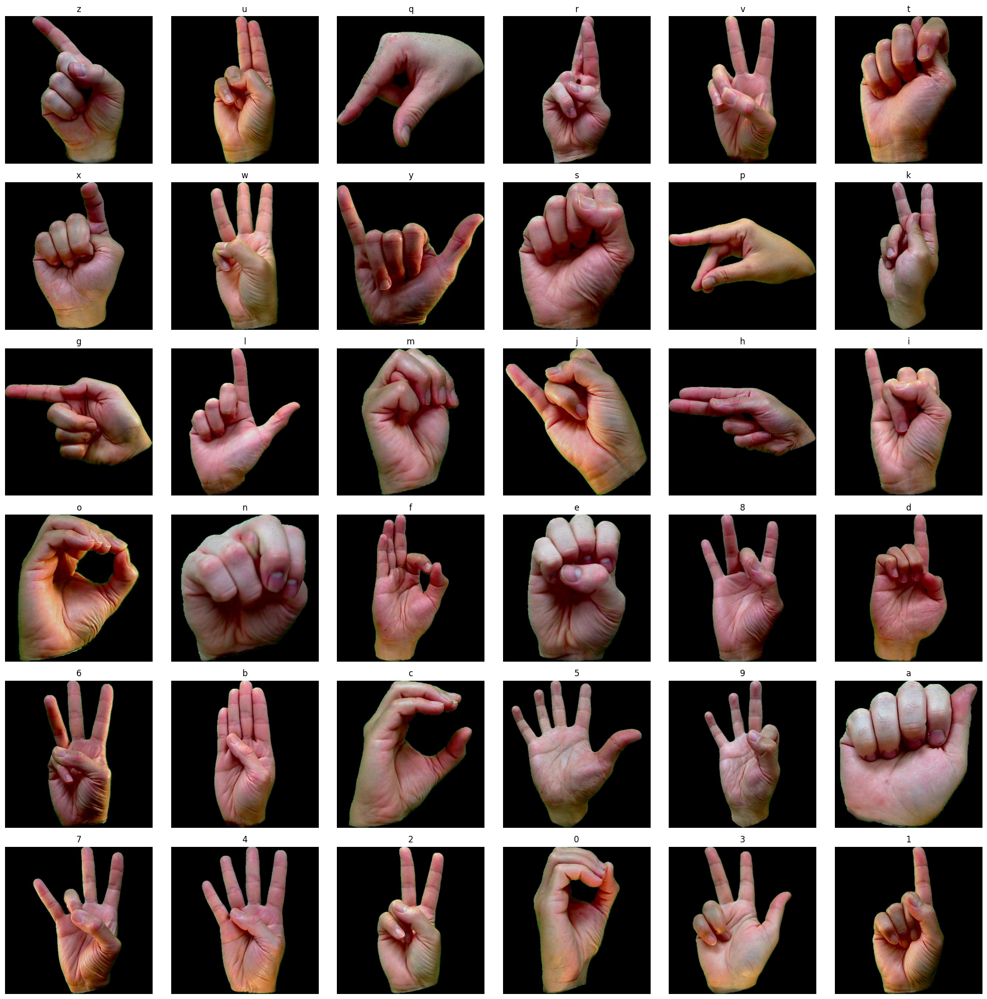

In [ ]:
# Define dataset directories
asl_dir = '/content/drive/MyDrive/Colab Notebooks/asl_dataset_split'
train_dir = os.path.join(asl_dir, 'train')

# Get list of classes (assuming each subdirectory in train_dir contains images of a single class)
classes = os.listdir(train_dir)

# Setup figure with subplots arranged horizontally
fig, axes = plt.subplots(6, 6, figsize=(20, 20))

# Flatten axes to iterate over them
axes = axes.flatten()

# Iterate through each class and display a sample image
for i, class_name in enumerate(classes):
    class_dir = os.path.join(train_dir, class_name)
    img_files = os.listdir(class_dir)
    img_path = os.path.join(class_dir, img_files[0])  # Take the first image as an example

    # Load and display image
    image = cv2.imread(img_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert from BGR to RGB for matplotlib

    axes[i].imshow(image)
    axes[i].set_title(class_name)
    axes[i].axis('off')

# Hide any extra subplots
for j in range(len(classes), len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()


#**2. Data Preprocessing**

3 steps included in data preprocessing such as image resizing, normalization and encoding to prepare the dataset for training MobileNetV2 and InceptionV3 effectively. The images in the dataset are resized to a consistent dimension with same input shape. Normalization involves scaling the pixel values of images to a range between 0 and 1.Encoding the class labels from string format into numerical format using label encoder.

##**i. Image Resizing**

Resizes the images to the target sizes required by the MobileNetV2 and InceptionV3 models and saves its in separate directories for each model.

In [ ]:
import os
from PIL import Image

# Define the target sizes
target_sizes = {
    'MobileNetV2': (224, 224),
    'InceptionV3': (299, 299)
}

# Define the directories to resize images in
directories = [train_dir, test_dir, val_dir]

# Define the output directories
output_dirs_resized = {
    'MobileNetV2': {
        'train': 'asl_dataset_resized/MobileNetV2/train',
        'test': 'asl_dataset_resized/MobileNetV2/test',
        'validation': 'asl_dataset_resized/MobileNetV2/validation'
    },
    'InceptionV3': {
        'train': 'asl_dataset_resized/InceptionV3/train',
        'test': 'asl_dataset_resized/InceptionV3/test',
        'validation': 'asl_dataset_resized/InceptionV3/validation'
    }
}

# Create the output directories if they do not exist
for model in output_dirs_resized:
    for split in output_dirs_resized[model]:
        os.makedirs(output_dirs_resized[model][split], exist_ok=True)
        for class_folder in os.listdir(directories[0]):  # Assuming all sets have same class folders
            os.makedirs(os.path.join(output_dirs_resized[model][split], class_folder), exist_ok=True)

# Loop through each directory
for directory, split in zip(directories, ['train', 'test', 'validation']):
    # Loop through each class folder in the directory
    for class_folder in os.listdir(directory):
        class_path = os.path.join(directory, class_folder)

        # Check if the path is a directory
        if os.path.isdir(class_path):
            # Loop through each image in the class folder
            for image_filename in os.listdir(class_path):
                image_path = os.path.join(class_path, image_filename)

                # Check if the path is a file before opening
                if os.path.isfile(image_path):
                    image = Image.open(image_path)

                    # Resize and save the image for each model
                    for model in target_sizes:
                        resized_image = image.resize(target_sizes[model])
                        output_path = os.path.join(output_dirs_resized[model][split], class_folder, image_filename)
                        resized_image.save(output_path)

print("Image resizing complete.")


Image resizing complete.


Visualizes the resized images for each model and displaying the class name and image size

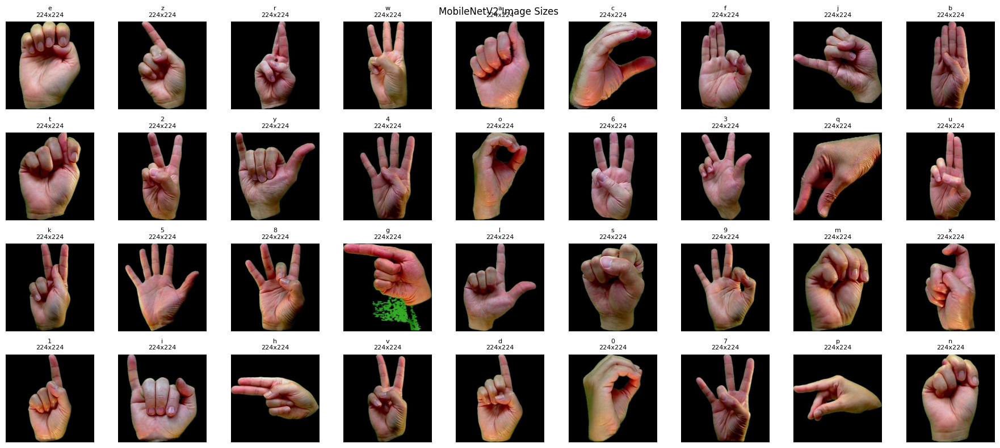

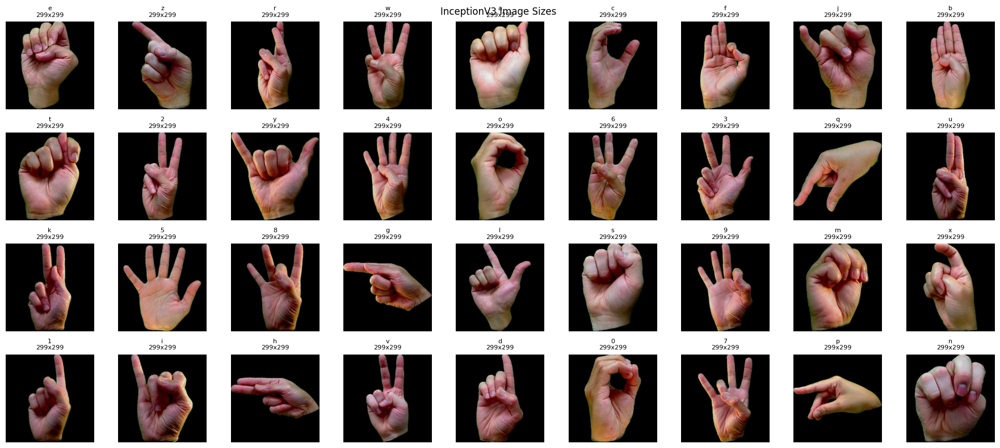

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Define directories for MobileNetV2 and InceptionV3
model_dirs = {
    'MobileNetV2': 'asl_dataset_resized/MobileNetV2',
    'InceptionV3': 'asl_dataset_resized/InceptionV3'
}

def visualize_image_sizes(model, model_dir):
    fig, ax = plt.subplots(4, 9, figsize=(18, 8))  # Adjust figsize for better readability

    # Collect directories
    img_classes = [os.path.join(model_dir, split, im) for split in ['train', 'test', 'validation'] for im in os.listdir(os.path.join(model_dir, split)) if os.path.isdir(os.path.join(model_dir, split, im))]

    ax = ax.flatten()

    for i, img_class in enumerate(img_classes[:36]):  # Limit iteration to the number of subplots
        imgs = os.listdir(img_class)
        if imgs:
            img = imgs[np.random.randint(0, len(imgs))]
            img_asldir = os.path.join(img_class, img)
            image = cv2.imread(img_asldir)
            if image is not None:  # Check if image was loaded successfully
                h, w, _ = image.shape  # Get the height and width of the image
                ax[i].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
                ax[i].set_title(f'{os.path.basename(img_class)}\n{w}x{h}', fontsize=8)  # Display the class and image size
                ax[i].axis('off')

    plt.tight_layout()  # Adjust layout to prevent overlapping
    plt.suptitle(f'{model} Image Sizes \n')
    print('')
    plt.show()

# Visualize image sizes for each model
for model, model_dir in model_dirs.items():
    visualize_image_sizes(model, model_dir)


##**ii. Image Normalization**

Processes the resized images to range [0, 1] and saves the normalized images in separate directories for each model.

In [ ]:
import os
from PIL import Image

# Define the target sizes
target_sizes = {
    'MobileNetV2': (32, 32),
    'InceptionV3': (299, 299)
}
# Define the directories containing resized images
resized_train_dir = 'asl_dataset_resized/{model}/train'
resized_test_dir = 'asl_dataset_resized/{model}/test'
resized_val_dir = 'asl_dataset_resized/{model}/validation'
resized_directories = [resized_train_dir, resized_test_dir, resized_val_dir]

# Define the output directories for normalized images
output_dirs_normalized = {
    'MobileNetV2': {
        'train': 'asl_dataset_normalized/MobileNetV2/train',
        'test': 'asl_dataset_normalized/MobileNetV2/test',
        'validation': 'asl_dataset_normalized/MobileNetV2/validation'
    },
    'InceptionV3': {
        'train': 'asl_dataset_normalized/InceptionV3/train',
        'test': 'asl_dataset_normalized/InceptionV3/test',
        'validation': 'asl_dataset_normalized/InceptionV3/validation'
    }
}

# Create the output directories if they do not exist
for model in output_dirs_normalized:
    for split in output_dirs_normalized[model]:
        os.makedirs(output_dirs_normalized[model][split], exist_ok=True)
        for class_folder in os.listdir(train_dir):  # Assuming all sets have the same class folders
            os.makedirs(os.path.join(output_dirs_normalized[model][split], class_folder), exist_ok=True)

# Function to normalize an image array
def normalize_image(image_array):
    return image_array / 255.0  # Normalizing to range [0, 1]

# Loop through each directory
for model in target_sizes:
    for directory, split in zip(resized_directories, ['train', 'test', 'validation']):
        dir_path = directory.format(model=model)
        # Loop through each class folder in the directory
        for class_folder in os.listdir(dir_path):
            class_path = os.path.join(dir_path, class_folder)

            # Check if the path is a directory
            if os.path.isdir(class_path):
                # Loop through each image in the class folder
                for image_filename in os.listdir(class_path):
                    image_path = os.path.join(class_path, image_filename)

                    # Check if the path is a file before opening
                    if os.path.isfile(image_path):
                        image = Image.open(image_path).convert('RGB')  # Ensure the image is in RGB format

                        # Normalize the image
                        image_array = np.array(image)
                        normalized_image_array = normalize_image(image_array)
                        normalized_image = Image.fromarray((normalized_image_array * 255).astype(np.uint8))  # Convert back to image

                        output_path = os.path.join(output_dirs_normalized[model][split], class_folder, image_filename)
                        normalized_image.save(output_path)

print("Image normalization complete.")

Image normalization complete.


Plotting original and normalized images with pixel values

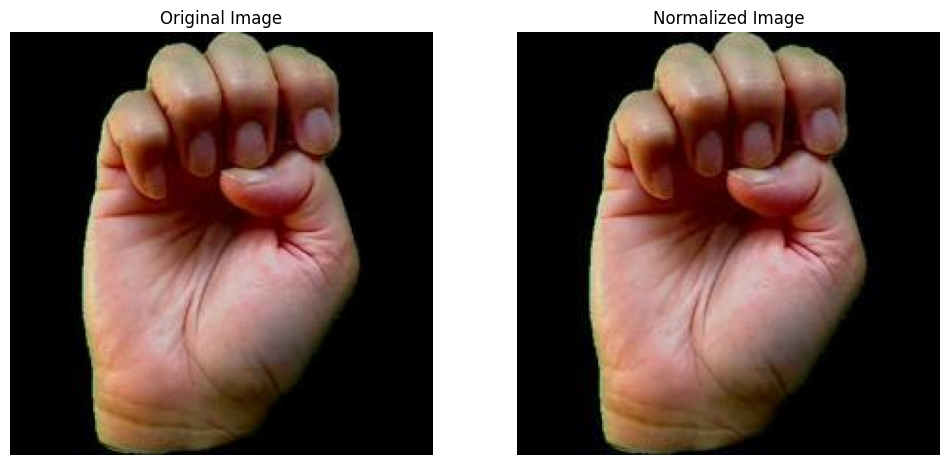

Original Image Pixel Values (Middle 5x5 region):
[[[ 96  44  33]
  [ 95  47  35]
  [ 93  49  38]
  [ 87  47  35]]

 [[ 96  46  37]
  [ 97  49  39]
  [105  61  50]
  [ 95  53  41]]

 [[ 97  48  41]
  [104  57  47]
  [112  65  55]
  [ 85  39  26]]

 [[106  59  51]
  [113  66  58]
  [103  56  46]
  [ 88  42  29]]]

Normalized Image Pixel Values (Middle 5x5 region):
[[[0.37647059 0.17254902 0.12941176]
  [0.37254902 0.18431373 0.1372549 ]
  [0.36470588 0.19215686 0.14901961]
  [0.34117647 0.18431373 0.1372549 ]]

 [[0.37647059 0.18039216 0.14509804]
  [0.38039216 0.19215686 0.15294118]
  [0.41176471 0.23921569 0.19607843]
  [0.37254902 0.20784314 0.16078431]]

 [[0.38039216 0.18823529 0.16078431]
  [0.40784314 0.22352941 0.18431373]
  [0.43921569 0.25490196 0.21568627]
  [0.33333333 0.15294118 0.10196078]]

 [[0.41568627 0.23137255 0.2       ]
  [0.44313725 0.25882353 0.22745098]
  [0.40392157 0.21960784 0.18039216]
  [0.34509804 0.16470588 0.11372549]]]


In [ ]:
import os
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image

# Function to plot original and normalized images with pixel values
def plot_images_with_pixel_values(original_image_path, normalized_image_path):
    original_image = Image.open(original_image_path).convert('RGB')
    normalized_image = Image.open(normalized_image_path).convert('RGB')

    original_image_array = np.array(original_image)
    normalized_image_array = np.array(normalized_image) / 255.0  # Ensuring the pixel values are in [0, 1]

    # Select a small region to display pixel values (e.g., middle 5x5 pixels)
    region_size = 5
    mid_x = original_image_array.shape[1] // 2
    mid_y = original_image_array.shape[0] // 2

    original_region = original_image_array[mid_y-region_size//2:mid_y+region_size//2, mid_x-region_size//2:mid_x+region_size//2]
    normalized_region = normalized_image_array[mid_y-region_size//2:mid_y+region_size//2, mid_x-region_size//2:mid_x+region_size//2]

    fig, axes = plt.subplots(1, 2, figsize=(12, 6))

    # Plot original image
    axes[0].imshow(original_image)
    axes[0].set_title("Original Image")
    axes[0].axis('off')

    # Plot normalized image
    axes[1].imshow(normalized_image)
    axes[1].set_title("Normalized Image")
    axes[1].axis('off')

    plt.show()

    print("Original Image Pixel Values (Middle 5x5 region):")
    print(original_region)

    print("\nNormalized Image Pixel Values (Middle 5x5 region):")
    print(normalized_region)

# Example usage with a sample image from the training set
model = 'MobileNetV2'  # Change to 'InceptionV3' if needed
train_dir = resized_train_dir.format(model=model)
class_folder = os.listdir(train_dir)[0]
image_filename = os.listdir(os.path.join(train_dir, class_folder))[0]

original_image_path = os.path.join(train_dir, class_folder, image_filename)
normalized_image_path = os.path.join(output_dirs_normalized[model]['train'], class_folder, image_filename)

plot_images_with_pixel_values(original_image_path, normalized_image_path)


##**iii. Encoding**

 Encode categorical class labels into integer values using LabelEncoder and how to reverse the encoding if needed.

In [ ]:
from sklearn.preprocessing import LabelEncoder

# Example class labels (replace with your actual class labels)
classes = ['0','1','2','3','4','5','6','7','8','9','A', 'B', 'C', 'D','E','F','G','H','I','J','K','L','M','N','O','P','Q','R','S','T','U','V','W','X','Y','Z']

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit on all classes
label_encoder.fit(classes)

# Example usage:
# Encode class labels for training and validation data
train_classes = ['0','1','2','3','4','5','6','7','8','9','A', 'B', 'C', 'D','E','F','G','H','I','J','K','L','M','N','O','P','Q','R','S','T','U','V','W','X','Y','Z']
val_classes = ['0','1','2','3','4','5','6','7','8','9','A', 'B', 'C', 'D','E','F','G','H','I','J','K','L','M','N','O','P','Q','R','S','T','U','V','W','X','Y','Z']

train_encoded = label_encoder.transform(train_classes)
val_encoded = label_encoder.transform(val_classes)

# Print encoded classes
print("Encoded training classes:", train_encoded)
print("Encoded validation classes:", val_encoded)

# Reverse transformation example
decoded_classes = label_encoder.inverse_transform(train_encoded)
print("Decoded classes:", decoded_classes)


Encoded training classes: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35]
Encoded validation classes: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35]
Decoded classes: ['0' '1' '2' '3' '4' '5' '6' '7' '8' '9' 'A' 'B' 'C' 'D' 'E' 'F' 'G' 'H'
 'I' 'J' 'K' 'L' 'M' 'N' 'O' 'P' 'Q' 'R' 'S' 'T' 'U' 'V' 'W' 'X' 'Y' 'Z']


#**3. Modelling**

##**Model 1: MobileNetV2**


MobileNetV2 is designed for image classification tasks specifically American Sign Language (ASL) recognition and involves three experiments such as a baseline model, unfreezing the classifier and unfreezing the classifier with fine-tuning. Each experiment consists of three steps building the model, training the model and evaluating the model.

###**Data Augmentation MobileNetV2**

Data augmentation are applied during the training process to let each epoch sees a different version of the data. Techniques like rotation, width/height shift, shear, zoom and horizontal flip introduce more complex transformations, helping the model to learn features invariant to these transformations.

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from tensorflow.keras.preprocessing.image import ImageDataGenerator

normalized_mob_train_dir = 'asl_dataset_normalized/MobileNetV2/train'
normalized_mob_val_dir = 'asl_dataset_normalized/MobileNetV2/validation'
normalized_mob_test_dir = 'asl_dataset_normalized/MobileNetV2/test'

# ImageDataGenerator for training data with augmentation
train_datagen_mob = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

# ImageDataGenerator for validation data (only rescaling)
val_datagen_mob = ImageDataGenerator(rescale=1./255)

# ImageDataGenerator for test data (only rescaling)
test_datagen_mob = ImageDataGenerator(rescale=1./255)

In [ ]:
# Flow training images in batches of 32 using train_datagen generator
train_generator_mob = train_datagen_mob.flow_from_directory(
    normalized_mob_train_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical'
)

# Flow validation images in batches of 32 using val_datagen generator
validation_generator_mob = val_datagen_mob.flow_from_directory(
    normalized_mob_val_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical'
)

# Flow test images in batches of 32 using test_datagen generator
test_generator_mob = test_datagen_mob.flow_from_directory(
    normalized_mob_test_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical'
)

Found 1760 images belonging to 36 classes.
Found 359 images belonging to 36 classes.
Found 396 images belonging to 36 classes.


###**i. Experiment 1: Baseline Model**

Baseline model is used to serves as the initial model to establish a performance benchmark.  Model is build with the top layers and no pre-trained weights are used to start training from scratch. All layers of the model trainable to allow the model to learn from the data fully.

#### **Building Model**

In [ ]:
import keras
import os, shutil
from tensorflow.keras.applications import MobileNetV2
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten
from keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import plot_model
from keras import optimizers

Base_mobV2 = MobileNetV2(
              input_shape=(224,224,3),
              include_top=True,
              weights=None,
              pooling=None,
              classes = 36,
              classifier_activation='softmax')


for layer in Base_mobV2.layers:
    layer.trainable = True

In [ ]:
Base_mobV2.summary()

Model: "mobilenetv2_1.00_224"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 Conv1 (Conv2D)              (None, 112, 112, 32)         864       ['input_2[0][0]']             
                                                                                                  
 bn_Conv1 (BatchNormalizati  (None, 112, 112, 32)         128       ['Conv1[0][0]']               
 on)                                                                                              
                                                                                                  
 Conv1_relu (ReLU)           (None, 112, 112, 32)         0         ['bn_Conv1[

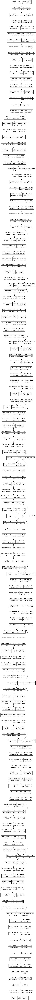

In [ ]:
keras.utils.plot_model(Base_mobV2, show_shapes=True)

####**Training model**

Compile the model using Adam optimizer and use categorical cross-entropy loss for multi-class classification.

In [ ]:
from tensorflow.keras import optimizers
from tensorflow.keras import applications

opt = keras.optimizers.Adam(learning_rate=0.001)
Base_mobV2.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])

Train the model for 30 epochs using the augmented training data and validate the model using the validation data.

In [ ]:
batch_size = 32

history_mobileNetV2_base = Base_mobV2.fit(
    train_generator_mob,
    steps_per_epoch=train_generator_mob.samples // batch_size,
    epochs=30,
    validation_data=validation_generator_mob,
    validation_steps=validation_generator_mob.samples // batch_size
)

Epoch 1/30
55/55 [==============================] - 23s 422ms/step - loss: 0.5109 - accuracy: 0.8136 - val_loss: 6.5090 - val_accuracy: 0.0256
Epoch 2/30
55/55 [==============================] - 42s 762ms/step - loss: 0.4525 - accuracy: 0.8369 - val_loss: 6.5221 - val_accuracy: 0.0284
Epoch 3/30
55/55 [==============================] - 29s 537ms/step - loss: 0.4457 - accuracy: 0.8386 - val_loss: 6.7666 - val_accuracy: 0.0284
Epoch 4/30
55/55 [==============================] - 27s 485ms/step - loss: 0.3861 - accuracy: 0.8523 - val_loss: 6.9995 - val_accuracy: 0.0284
Epoch 5/30
55/55 [==============================] - 45s 831ms/step - loss: 0.3669 - accuracy: 0.8653 - val_loss: 7.5875 - val_accuracy: 0.0284
Epoch 6/30
55/55 [==============================] - 36s 647ms/step - loss: 0.3187 - accuracy: 0.8790 - val_loss: 7.7194 - val_accuracy: 0.0256
Epoch 7/30
55/55 [==============================] - 23s 415ms/step - loss: 0.3572 - accuracy: 0.8727 - val_loss: 8.3776 - val_accuracy: 0.0284

In [ ]:
Base_mobV2.save('/content/drive/MyDrive/Colab Notebooks/Saved model/baseline_mobV2')

####**Model Evaluation**

Plot the training and validation accuracy, as well as the validation loss, over epochs to evaluate the model's performance and identify overfitting or underfitting.

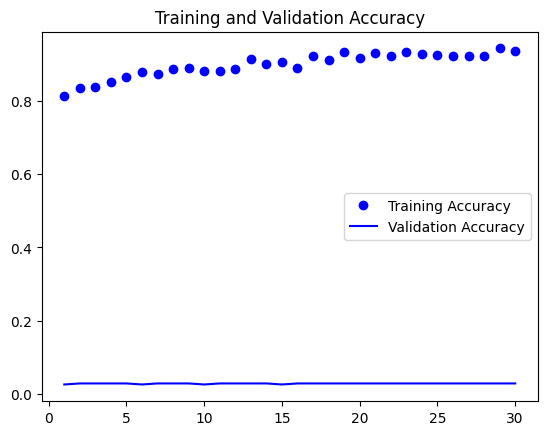

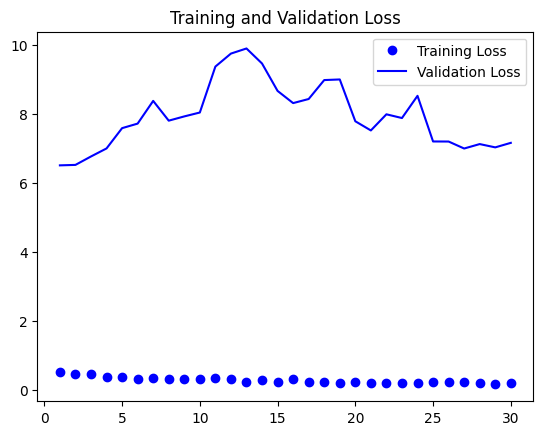

In [ ]:
import matplotlib.pyplot as plt

acc = history_mobileNetV2_base.history['accuracy']
val_acc = history_mobileNetV2_base.history['val_accuracy']
loss = history_mobileNetV2_base.history['loss']
val_loss = history_mobileNetV2_base.history['val_loss']

epochs = range(1, len(acc) + 1)

plt.plot (epochs, acc, 'bo', label='Training Accuracy')
plt.plot (epochs, val_acc, 'b', label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()

plt.figure()

plt.plot (epochs, loss, 'bo', label='Training Loss')
plt.plot (epochs, val_loss, 'b', label='Validation Loss')
plt.title('Training and Validation Loss')
plt.legend()

plt.show()

Generate predictions on the test data and compute the classification report and confusion matrix.

In [ ]:
true_labels = test_generator_mob.classes

predicted_labels = np.argmax(Base_mobV2.predict(test_generator_mob), axis=1)

from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

print(classification_report(true_labels, predicted_labels))
print(confusion_matrix(true_labels, predicted_labels))

13/13 [==============================] - 2s 122ms/step
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        11
           1       0.00      0.00      0.00        11
           2       0.00      0.00      0.00        11
           3       0.00      0.00      0.00        11
           4       0.00      0.00      0.00        11
           5       0.00      0.00      0.00        11
           6       0.00      0.00      0.00        11
           7       0.00      0.00      0.00        11
           8       0.00      0.00      0.00        11
           9       0.00      0.00      0.00        11
          10       0.00      0.00      0.00        11
          11       0.00      0.00      0.00        11
          12       0.03      1.00      0.05        11
          13       0.00      0.00      0.00        11
          14       0.00      0.00      0.00        11
          15       0.00      0.00      0.00        11
          16       0.00   

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


###**ii. Experiment 2: Unfreezing Classifier**

Unfreezing classifier leverages pre-trained weights from ImageNet while adding custom top layers for ASL classification.

####**Building model**

Load MobileNetV2 without the top layer and with ImageNet weights. The base model is used to extract features.

In [ ]:
# Load the MobileNetV2 model without the top layer
mobileNetV2 = MobileNetV2(input_shape=(224, 224, 3),
                         include_top=False,
                         weights='imagenet',
                         pooling=None)

9406464/9406464 [==============================] - 0s 0us/step


Freeze all layers of the base MobileNetV2 model to prevent updating the pre-trained weights during training.

In [ ]:
for layer in mobileNetV2.layers:
    layer.trainable = False

Add New Top Layers

In [ ]:
import keras
from keras.layers import GlobalAveragePooling2D

mobileNetV2TL = keras.models.Sequential()
mobileNetV2TL.add(mobileNetV2)
mobileNetV2TL.add(GlobalAveragePooling2D())
mobileNetV2TL.add(Dense(1024, activation='relu'))
mobileNetV2TL.add(Dense(512, activation='relu'))
mobileNetV2TL.add(Dense(36, activation='softmax'))

Summary of Model

In [ ]:
mobileNetV2TL.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenetv2_1.00_224 (Func  (None, 7, 7, 1280)        2257984   
 tional)                                                         
                                                                 
 global_average_pooling2d (  (None, 1280)              0         
 GlobalAveragePooling2D)                                         
                                                                 
 dense (Dense)               (None, 1024)              1311744   
                                                                 
 dense_1 (Dense)             (None, 512)               524800    
                                                                 
 dense_2 (Dense)             (None, 36)                18468     
                                                                 
Total params: 4112996 (15.69 MB)
Trainable params: 185

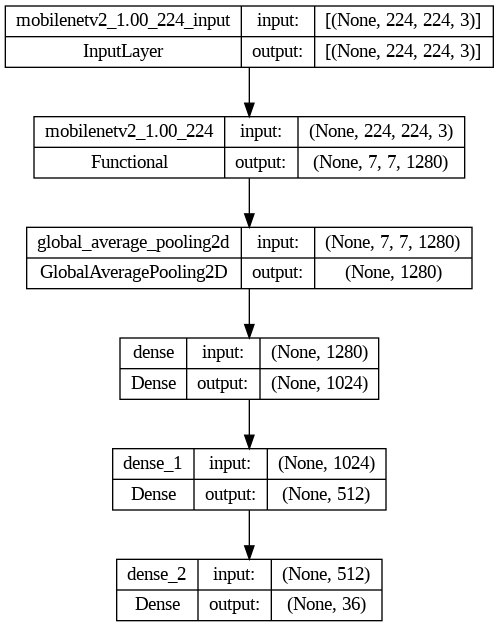

In [ ]:
keras.utils.plot_model(mobileNetV2TL, show_shapes=True)

####**Training model**

Train the model for 30 epochs using the augmented training data and validate the model using the validation data.

In [ ]:
from tensorflow.keras import optimizers
from tensorflow.keras import applications

mobileNetV2TL.compile(loss='categorical_crossentropy',
                      optimizer=optimizers.Adam(learning_rate=0.001),
                      metrics=['accuracy'])

In [ ]:
batch_size = 32

history_mobileNetV2TL = mobileNetV2TL.fit(
    train_generator_mob,
    steps_per_epoch=train_generator_mob.samples // batch_size,
    epochs=30,  # Increase the number of epochs
    validation_data=validation_generator_mob,
    validation_steps=validation_generator_mob.samples // batch_size
)

Epoch 1/30
55/55 [==============================] - 126s 2s/step - loss: 2.1911 - accuracy: 0.3648 - val_loss: 1.0775 - val_accuracy: 0.6392
Epoch 2/30
55/55 [==============================] - 126s 2s/step - loss: 1.0309 - accuracy: 0.6551 - val_loss: 0.7376 - val_accuracy: 0.7415
Epoch 3/30
55/55 [==============================] - 128s 2s/step - loss: 0.7381 - accuracy: 0.7386 - val_loss: 0.4931 - val_accuracy: 0.8125
Epoch 4/30
55/55 [==============================] - 148s 3s/step - loss: 0.6357 - accuracy: 0.7784 - val_loss: 0.5404 - val_accuracy: 0.8153
Epoch 5/30
55/55 [==============================] - 129s 2s/step - loss: 0.5324 - accuracy: 0.8045 - val_loss: 0.5730 - val_accuracy: 0.7955
Epoch 6/30
55/55 [==============================] - 128s 2s/step - loss: 0.5427 - accuracy: 0.8119 - val_loss: 0.6381 - val_accuracy: 0.7926
Epoch 7/30
55/55 [==============================] - 129s 2s/step - loss: 0.4457 - accuracy: 0.8375 - val_loss: 0.4547 - val_accuracy: 0.8551
Epoch 8/30
55

####**Model Evaluation**

Plot the training and validation accuracy, as well as the validation loss, over epochs to evaluate the model's performance and identify overfitting or underfitting.

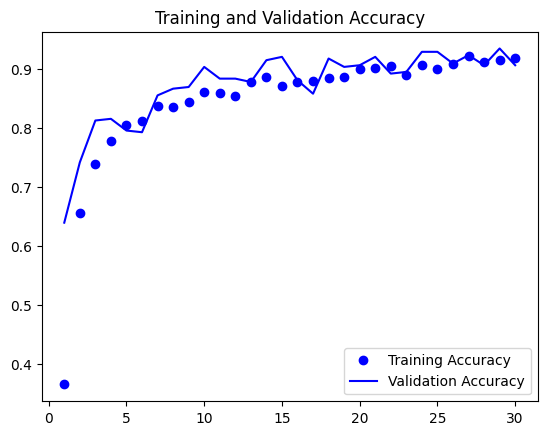

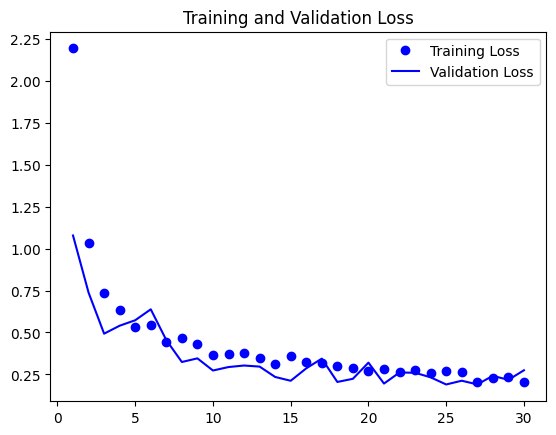

In [ ]:
# Model Evaluation
acc = history_mobileNetV2TL.history['accuracy']
val_acc = history_mobileNetV2TL.history['val_accuracy']
loss = history_mobileNetV2TL.history['loss']
val_loss = history_mobileNetV2TL.history['val_loss']

epochs = range(1, len(acc) + 1)

plt.plot(epochs, acc, 'bo', label='Training Accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training Loss')
plt.plot(epochs, val_loss, 'b', label='Validation Loss')
plt.title('Training and Validation Loss')
plt.legend()

plt.show()

In [ ]:
# Obtain the true and predicted labels for the test set
y_true = test_generator_mob.classes
y_pred = mobileNetV2TL.predict(test_generator_mob, steps=test_generator_mob.samples // batch_size + 1)
y_pred_classes = np.argmax(y_pred, axis=1)


13/13 [==============================] - 33s 2s/step


In [ ]:
import numpy as np
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Obtain the true class labels from the test data
y_true = test_generator_mob.labels

# Calculate accuracy
accuracy = accuracy_score(y_true, y_pred_classes)

# Calculate precision
precision = precision_score(y_true, y_pred_classes,average='macro')

# Calculate recall
recall = recall_score(y_true, y_pred_classes,average='macro')

# Calculate F1-score
f1 = f1_score(y_true, y_pred_classes,average='macro')

print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1)

Accuracy: 0.027777777777777776
Precision: 0.0274293607626941
Recall: 0.027777777777777776
F1-score: 0.027466329966329972


Generate predictions on the test data and compute the classification report and confusion matrix.

In [ ]:
true_labels = test_generator_mob.classes

predicted_labels = np.argmax(mobileNetV2TL.predict(test_generator_mob), axis=1)

from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

print(classification_report(true_labels, predicted_labels))
print(confusion_matrix(true_labels, predicted_labels))

13/13 [==============================] - 18s 1s/step
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        11
           1       0.00      0.00      0.00        11
           2       0.00      0.00      0.00        11
           3       0.00      0.00      0.00        11
           4       0.00      0.00      0.00        11
           5       0.09      0.09      0.09        11
           6       0.10      0.18      0.13        11
           7       0.00      0.00      0.00        11
           8       0.00      0.00      0.00        11
           9       0.00      0.00      0.00        11
          10       0.00      0.00      0.00        11
          11       0.00      0.00      0.00        11
          12       0.00      0.00      0.00        11
          13       0.00      0.00      0.00        11
          14       0.10      0.09      0.10        11
          15       0.00      0.00      0.00        11
          16       0.00     

###**iii. Experiment 3: Unfreezing Classifier with Fine Tuning**

Unfreezing specific layers in the base model for fine-tuning to adjust pre-trained weights while learning the new task and improved performance.

####**Building model**

Load MobileNetV2 without the top layer and with ImageNet weights. The base model is used to extract features.

In [ ]:
import keras
import os, shutil

from tensorflow.keras.applications import MobileNetV2
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten
from keras.preprocessing.image import ImageDataGenerator
from keras.utils import  plot_model
from keras import optimizers

import pandas as pd
import numpy as np

In [ ]:
MobileNetV2_model = MobileNetV2(include_top=False,
              weights='imagenet',
              input_shape=(224,224,3),
              pooling=None,
              classifier_activation='softmax')

9406464/9406464 [==============================] - 0s 0us/step


Set specific layers such as 'block_16_project_BN', 'block_16_expand' as trainable while other layers remain frozen to retain pre-trained weights.

In [ ]:
MobileNetV2_model.trainable = True

set_trainable = False
for layer in MobileNetV2_model.layers:
    if layer.name in ['block_16_project_BN', 'block_16_expand']:
        set_trainable = True
    if set_trainable:
        layer.trainable = True
    else:
        layer.trainable = False

layers = [(layer, layer.name, layer.trainable) for layer in MobileNetV2_model.layers]
pd.DataFrame(layers, columns=['Layer Type', 'Layer Name', 'Layer Trainable'])

,Layer Type,Layer Name,Layer Trainable
0,<keras.src.engine.input_layer.InputLayer objec...,input_1,False
1,<keras.src.layers.convolutional.conv2d.Conv2D ...,Conv1,False
2,<keras.src.layers.normalization.batch_normaliz...,bn_Conv1,False
3,<keras.src.layers.activation.relu.ReLU object ...,Conv1_relu,False
4,<keras.src.layers.convolutional.depthwise_conv...,expanded_conv_depthwise,False
...,...,...,...
149,<keras.src.layers.convolutional.conv2d.Conv2D ...,block_16_project,True
150,<keras.src.layers.normalization.batch_normaliz...,block_16_project_BN,True
151,<keras.src.layers.convolutional.conv2d.Conv2D ...,Conv_1,True
152,<keras.src.layers.normalization.batch_normaliz...,Conv_1_bn,True


Add New Top Layers

In [ ]:
import keras
from keras.layers import Flatten, Dropout, Dense, GlobalAveragePooling2D

mobileNetV2FT = keras.models.Sequential()
mobileNetV2FT.add(MobileNetV2_model)

mobileNetV2FT.add(GlobalAveragePooling2D(name='avg_pool'))

mobileNetV2FT.add(Dense(1024, activation='relu'))
mobileNetV2FT.add(Dropout(0.5, name='dropout1'))
mobileNetV2FT.add(Dense(512, activation='relu'))
mobileNetV2FT.add(Dropout(0.3, name='dropout2'))
mobileNetV2FT.add(Dense(36, activation='softmax', name='predictions'))

Summary of Model

In [ ]:
mobileNetV2FT.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenetv2_1.00_224 (Func  (None, 7, 7, 1280)        2257984   
 tional)                                                         
                                                                 
 avg_pool (GlobalAveragePoo  (None, 1280)              0         
 ling2D)                                                         
                                                                 
 dense (Dense)               (None, 1024)              1311744   
                                                                 
 dropout1 (Dropout)          (None, 1024)              0         
                                                                 
 dense_1 (Dense)             (None, 512)               524800    
                                                                 
 dropout2 (Dropout)          (None, 512)               0

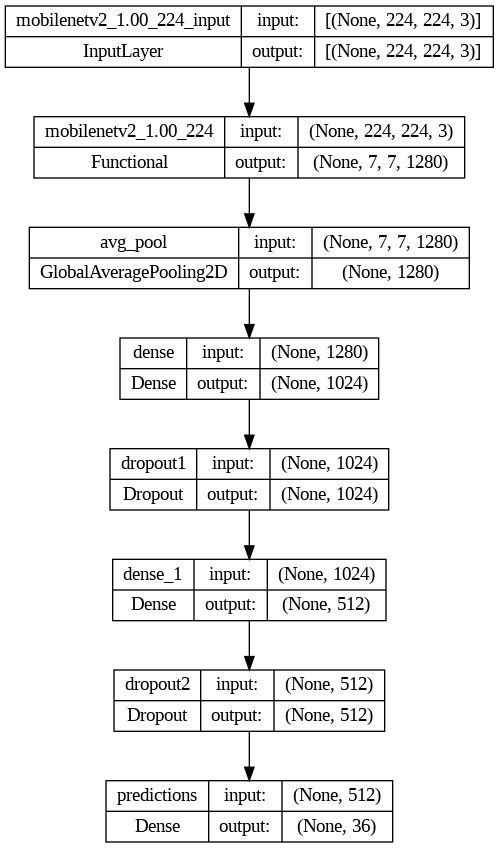

In [ ]:
keras.utils.plot_model(mobileNetV2FT, show_shapes=True)

Compile the model using the Adam optimizer, categorical cross-entropy loss and accuracy as the metric.

In [ ]:
from tensorflow.keras import optimizers
from tensorflow.keras import applications

opt = keras.optimizers.Adam(learning_rate=0.001)
mobileNetV2FT.compile(optimizer=opt,
                   loss='categorical_crossentropy',
                   metrics=['accuracy'])

####**Training model**

Train the model for 30 epochs using the augmented training data and validation data.

In [ ]:
print (len(train_generator_mob))
history = mobileNetV2FT.fit(
            train_generator_mob,
            epochs=30,
            steps_per_epoch=len(train_generator_mob),
            validation_data=validation_generator_mob,
            validation_steps=len(validation_generator_mob)
)

55
Epoch 1/30
55/55 [==============================] - 142s 2s/step - loss: 2.7317 - accuracy: 0.2210 - val_loss: 9.6713 - val_accuracy: 0.1226
Epoch 2/30
55/55 [==============================] - 141s 3s/step - loss: 1.3703 - accuracy: 0.5369 - val_loss: 9.1784 - val_accuracy: 0.1281
Epoch 3/30
55/55 [==============================] - 141s 3s/step - loss: 0.8790 - accuracy: 0.7034 - val_loss: 13.6449 - val_accuracy: 0.1393
Epoch 4/30
55/55 [==============================] - 134s 2s/step - loss: 0.7107 - accuracy: 0.7420 - val_loss: 12.6384 - val_accuracy: 0.1560
Epoch 5/30
55/55 [==============================] - 147s 3s/step - loss: 0.6337 - accuracy: 0.7756 - val_loss: 6.5581 - val_accuracy: 0.3008
Epoch 6/30
55/55 [==============================] - 141s 3s/step - loss: 0.4804 - accuracy: 0.8375 - val_loss: 7.2971 - val_accuracy: 0.3092
Epoch 7/30
55/55 [==============================] - 144s 3s/step - loss: 0.4337 - accuracy: 0.8420 - val_loss: 4.5758 - val_accuracy: 0.3872
Epoch 8/

In [ ]:
mobileNetV2FT.save('/content/drive/MyDrive/Colab Notebooks/Saved model/mobileNetV2FT.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


####**Model Evaluation**

Plot the training and validation accuracy, as well as the validation loss, over epochs to evaluate the model's performance and identify overfitting or underfitting.

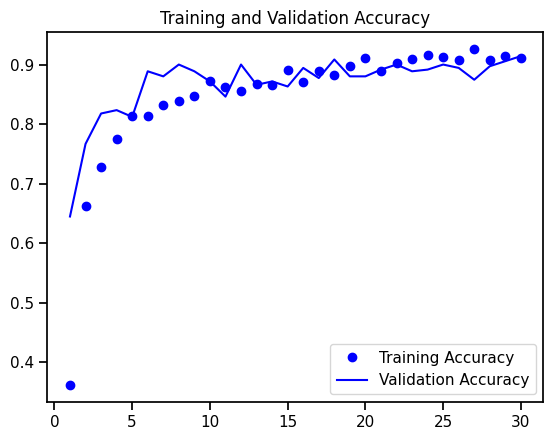

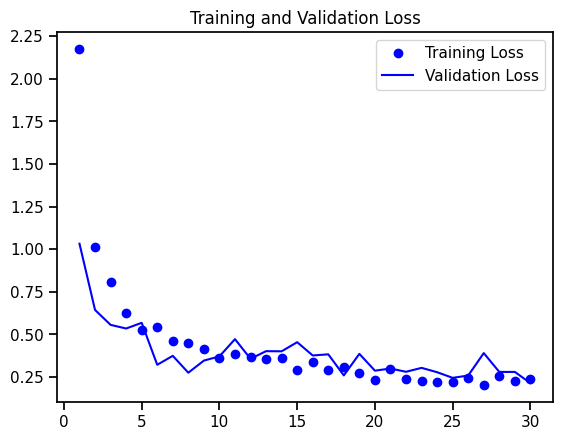

In [ ]:
# Model Evaluation
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)

plt.plot(epochs, acc, 'bo', label='Training Accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training Loss')
plt.plot(epochs, val_loss, 'b', label='Validation Loss')
plt.title('Training and Validation Loss')
plt.legend()

plt.show()

In [ ]:
from keras import models

# Load the saved model
saved_mobV2FT_model = models.load_model('/content/drive/MyDrive/Colab Notebooks/Saved model/mobileNetV2FT.h5')

# Predict the classes for the test data
y_pred = saved_mobV2FT_model.predict(test_generator_mob)
y_pred_classes = np.argmax(y_pred, axis=1)

# Get the true classes for the test data
y_true = test_generator_mob.classes

# Evaluate the model on the test data
test_loss, test_acc = saved_mobV2FT_model.evaluate(test_generator_mob)
print(f'Test Accuracy: {test_acc}')
print(f'Test Loss: {test_loss}')


13/13 [==============================] - 19s 1s/step - loss: 1.9113 - accuracy: 0.6793
Test Accuracy: 0.6792929172515869
Test Loss: 1.9113188982009888


In [ ]:
y_pred_classes = np.argmax(y_pred, axis=1)

y_true = test_generator_mob.classes

In [ ]:
import numpy as np
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Obtain the true class labels from the test data
y_true = test_generator_mob.labels

# Calculate accuracy
accuracy = accuracy_score(y_true, y_pred_classes)

# Calculate precision
precision = precision_score(y_true, y_pred_classes,average='macro')

# Calculate recall
recall = recall_score(y_true, y_pred_classes,average='macro')

# Calculate F1-score
f1 = f1_score(y_true, y_pred_classes,average='macro')

print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1)

Accuracy: 0.6792929292929293
Precision: 0.7622319089626542
Recall: 0.6792929292929294
F1-score: 0.6503930677210541


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Generate predictions on the test data and compute the classification report and confusion matrix.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       1.00      0.09      0.17        11
           1       0.50      0.91      0.65        11
           2       0.42      0.91      0.57        11
           3       0.79      1.00      0.88        11
           4       1.00      0.18      0.31        11
           5       1.00      0.55      0.71        11
           6       0.00      0.00      0.00        11
           7       0.80      0.73      0.76        11
           8       1.00      0.09      0.17        11
           9       0.91      0.91      0.91        11
           a       1.00      0.18      0.31        11
           b       0.00      0.00      0.00        11
           c       0.61      1.00      0.76        11
           d       1.00      0.73      0.84        11
           e       1.00      0.64      0.78        11
           f       1.00      0.82      0.90        11
           g       0.67      0.91      0.77        11
           h       0.23    

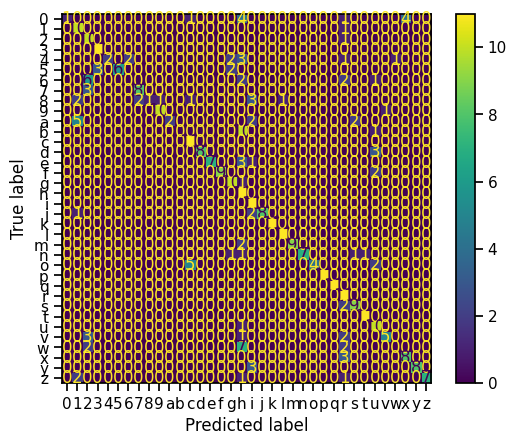

In [ ]:
from sklearn import metrics
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
import numpy as np
import seaborn as sns


# Generate the classification report
class_labels = list(test_generator_mob.class_indices.keys())
report = classification_report(y_true, y_pred_classes, target_names=class_labels)
print(report)

# Generate the confusion matrix
cm = metrics.confusion_matrix(y_true, y_pred_classes)
sns.set_context('notebook')
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=class_labels)
disp.plot()
print("Confusion Matrix:")
print(cm)

##**Model 2: InceptionV3**

Three experiments using InceptionV3 for American Sign Language (ASL) recognition which is baseline model, unfreezing the classifier and unfreezing the classifier with fine-tuning. Each experiment involves building the model, training the model and evaluating the model.

###**Data Augmentation InceptionV3**

Creating a separate data augmentation setup for InceptionV3 is important to tailored augmentation parameters, maintain consistency in data preprocessing, optimize the performance of the model and maintaining separate data augmentation setups.

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from tensorflow.keras.preprocessing.image import ImageDataGenerator

normalized_inc_train_dir = 'asl_dataset_normalized/InceptionV3/train'
normalized_inc_val_dir = 'asl_dataset_normalized/InceptionV3/validation'
normalized_inc_test_dir = 'asl_dataset_normalized/InceptionV3/test'

# ImageDataGenerator for training data with augmentation
train_datagen_inc = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

# ImageDataGenerator for validation data (only rescaling)
val_datagen_inc = ImageDataGenerator(rescale=1./255)

# ImageDataGenerator for test data (only rescaling)
test_datagen_inc = ImageDataGenerator(rescale=1./255)

In [ ]:
# Flow training images in batches of 32 using train_datagen generator
train_generator_inc = train_datagen_inc.flow_from_directory(
    normalized_inc_train_dir,
    target_size=(299, 299),
    batch_size=32,
    class_mode='categorical'
)

# Flow validation images in batches of 32 using val_datagen generator
validation_generator_inc = val_datagen_inc.flow_from_directory(
    normalized_inc_val_dir,
    target_size=(299, 299),
    batch_size=32,
    class_mode='categorical'
)

# Flow test images in batches of 32 using test_datagen generator
test_generator_inc = test_datagen_inc.flow_from_directory(
    normalized_inc_test_dir,
    target_size=(299, 299),
    batch_size=32,
    class_mode='categorical'
)



Found 1760 images belonging to 36 classes.
Found 359 images belonging to 36 classes.
Found 396 images belonging to 36 classes.


###**i. Experiment 1: Baseline Model**

The baseline model is the initial model using InceptionV3 to establish a performance benchmark. Load InceptionV3 with top layers included the fully connected layers at the end and No pre-trained weights are used to start training from scratch.

####**Building model**


Make all layers of the model trainable to allow the model to learn from the data fully.

In [ ]:
import keras
import os, shutil
from tensorflow.keras.applications import InceptionV3
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten
from keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import plot_model
from keras import optimizers

Base_incV3 = InceptionV3(include_top=True,
              weights=None,
              input_shape=(299,299,3),
              classes = 36,
              pooling=None,
              classifier_activation='softmax')


for layer in Base_incV3.layers:
    layer.trainable = True

Summary of the Model

In [ ]:
Base_incV3.summary()

Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 299, 299, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 149, 149, 32)         864       ['input_1[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, 149, 149, 32)         96        ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 activation (Activation)     (None, 149, 149, 32)         0         ['batch_normalizati

In [ ]:
keras.utils.plot_model(Base_incV3, show_shapes=True)

In [ ]:
from tensorflow.keras import optimizers
from tensorflow.keras import applications

Compile the model by using the Adam optimizer and categorical cross-entropy loss for multi-class classification.


In [ ]:
opt = keras.optimizers.Adam(learning_rate=0.001)
Base_incV3.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])

####**Training model**

Train the model for 30 epochs using the augmented training data and validate it using the validation data.

In [ ]:
# prompt: code for model training
# prompt: write code for model training
print (len(train_generator_inc))
history1 = Base_incV3.fit(
    train_generator_inc,
    epochs=30,
    steps_per_epoch=len(train_generator_inc),
    validation_data=validation_generator_inc,
    validation_steps=len(validation_generator_inc)
)

55
Epoch 1/30
55/55 [==============================] - 99s 925ms/step - loss: 2.8664 - accuracy: 0.2028 - val_loss: 15.1168 - val_accuracy: 0.0279
Epoch 2/30
55/55 [==============================] - 49s 896ms/step - loss: 1.7497 - accuracy: 0.4227 - val_loss: 8.1661 - val_accuracy: 0.0279
Epoch 3/30
55/55 [==============================] - 48s 870ms/step - loss: 1.3245 - accuracy: 0.5341 - val_loss: 8.6380 - val_accuracy: 0.0279
Epoch 4/30
55/55 [==============================] - 49s 879ms/step - loss: 0.9636 - accuracy: 0.6670 - val_loss: 4.3032 - val_accuracy: 0.0084
Epoch 5/30
55/55 [==============================] - 50s 902ms/step - loss: 0.8068 - accuracy: 0.7182 - val_loss: 7.1531 - val_accuracy: 0.0362
Epoch 6/30
55/55 [==============================] - 49s 880ms/step - loss: 0.6448 - accuracy: 0.7619 - val_loss: 6.2205 - val_accuracy: 0.1253
Epoch 7/30
55/55 [==============================] - 49s 885ms/step - loss: 0.6224 - accuracy: 0.7790 - val_loss: 6.0973 - val_accuracy: 0.

In [ ]:
Base_incV3.save('/content/drive/MyDrive/Colab Notebooks/Saved model/baseline_inV3')

####**Model Evaluation**

Plot the training and validation accuracy, as well as the validation loss, over epochs to evaluate the model's performance and identify overfitting or underfitting.

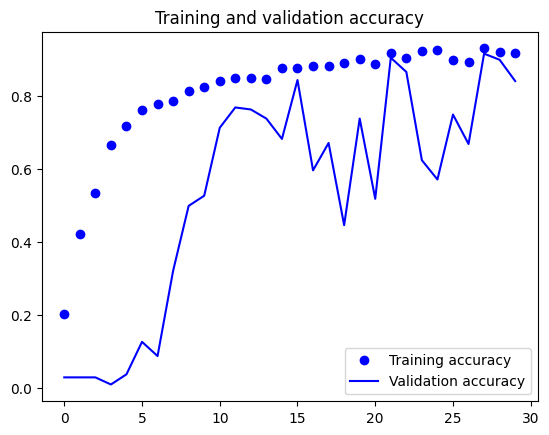

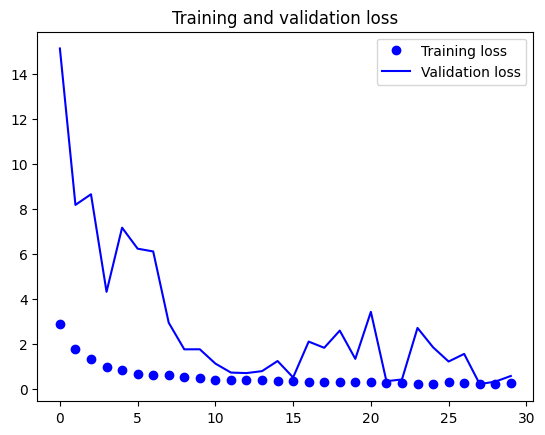

In [ ]:
import matplotlib.pyplot as plt

accuracy = history1.history['accuracy']
val_accuracy = history1.history['val_accuracy']
loss = history1.history['loss']
val_loss = history1.history['val_loss']

epochs = range(len(accuracy))

plt.plot(epochs, accuracy, 'bo', label='Training accuracy')
plt.plot(epochs, val_accuracy, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

Visualize the predictions made by the model, a grid of images along with their predicted labels can be displayed.

In [ ]:
# display a grid of images, along with optional labels, and the ability to save the grid as an image file.
# visualizse image datasets or model predictions

def show_grid(image_list,nrows,ncols,label_list=None,show_labels=False,savename=None,figsize=(10,10),showaxis='off'):
    if type(image_list) is not list:
        if(image_list.shape[-1]==1):
            image_list = [image_list[i,:,:,0] for i in range(image_list.shape[0])]
        elif(image_list.shape[-1]==3):
            image_list = [image_list[i,:,:,:] for i in range(image_list.shape[0])]
    fig = plt.figure(None, figsize,frameon=False)
    grid = ImageGrid(fig, 111,
                     nrows_ncols=(nrows, ncols),
                     axes_pad=0.3,
                     share_all=True,
                     )
    for i in range(nrows*ncols):
        ax = grid[i]
        ax.imshow(image_list[i],cmap='Greys_r')
        ax.axis('off')
        if show_labels:
            ax.set_title(class_mapping[y_int[i]])
    if savename != None:
        plt.savefig(savename,bbox_inches='tight')

In [ ]:
from keras import models
import numpy as np

# Load the saved model
saved_incV3_model = models.load_model('/content/drive/MyDrive/Colab Notebooks/Saved model/baseline_inV3')



# Create a test data generator
test_generator_inc = test_datagen_inc.flow_from_directory(
    normalized_inc_test_dir,
    target_size=(299, 299),
    batch_size=32,
    class_mode='categorical',
    shuffle=False)

# Predict the classes for the test data
y_pred = saved_incV3_model.predict(test_generator_inc)
y_pred_classes = np.argmax(y_pred, axis=1)

#y_pred_classes = np.argmax(y_pred, axis=1)

# Get the true classes for the test data
y_true = test_generator_inc.classes


Found 396 images belonging to 36 classes.
13/13 [==============================] - 7s 411ms/step


In [ ]:
import numpy as np

y_pred_classes = np.argmax(y_pred, axis=1)

#y_pred_classes = np.argmax(y_pred, axis=1)

# Get the true classes for the test data
y_true = test_generator_inc.classes

In [ ]:
#structure and format of the input data used for image classification
x, y = next(test_generator_inc) # obtain the next batch of data - with labels from the generator
print("x", type(x))
print("y", type(y))
print("x", x.shape)
print("y", y.shape)

x <class 'numpy.ndarray'>
y <class 'numpy.ndarray'>
x (32, 299, 299, 3)
y (32, 36)


In [ ]:
print(test_generator.class_indices)

{'0': 0, '1': 1, '2': 2, '3': 3, '4': 4, '5': 5, '6': 6, '7': 7, '8': 8, '9': 9, 'a': 10, 'b': 11, 'c': 12, 'd': 13, 'e': 14, 'f': 15, 'g': 16, 'h': 17, 'i': 18, 'j': 19, 'k': 20, 'l': 21, 'm': 22, 'n': 23, 'o': 24, 'p': 25, 'q': 26, 'r': 27, 's': 28, 't': 29, 'u': 30, 'v': 31, 'w': 32, 'x': 33, 'y': 34, 'z': 35}


In [ ]:
y_int = y_pred_classes
class_mapping = ['0', '1','2', '3','4', '5','6', '7','8', '9','a', 'b','c', 'd','e', 'f','g', 'h','i', 'j','k', 'l','m', 'n','o', 'p','q', 'r','s', 't','u', 'v','w', 'x','y', 'z',]

In [ ]:
label_mapping = {'0': 0, '1': 1, '2': 2, '3': 3, '4': 4, '5': 5, '6': 6, '7': 7, '8': 8, '9': 9, 'a': 10, 'b': 11, 'c': 12, 'd': 13, 'e': 14, 'f': 15, 'g': 16, 'h': 17,
 'i': 18, 'j': 19, 'k': 20, 'l': 21, 'm': 22, 'n': 23, 'o': 24, 'p': 25, 'q': 26, 'r': 27, 's': 28, 't': 29, 'u': 30, 'v': 31, 'w': 32, 'x': 33, 'y': 34, 'z': 35}
class_mapping = ['0', '1','2', '3','4', '5','6', '7','8', '9','a', 'b','c', 'd','e', 'f','g', 'h','i', 'j','k', 'l','m', 'n','o', 'p','q', 'r','s', 't','u', 'v','w', 'x','y', 'z',]

# Create a dictionary to map the original labels to modified labels
class_label_mapping = {class_mapping[i]: label_mapping[class_mapping[i]] for i in range(len(class_mapping))}

# define the label
y_int = [class_label_mapping[class_mapping[y_pred_classes[i]]] for i in range(len(y_pred_classes))]


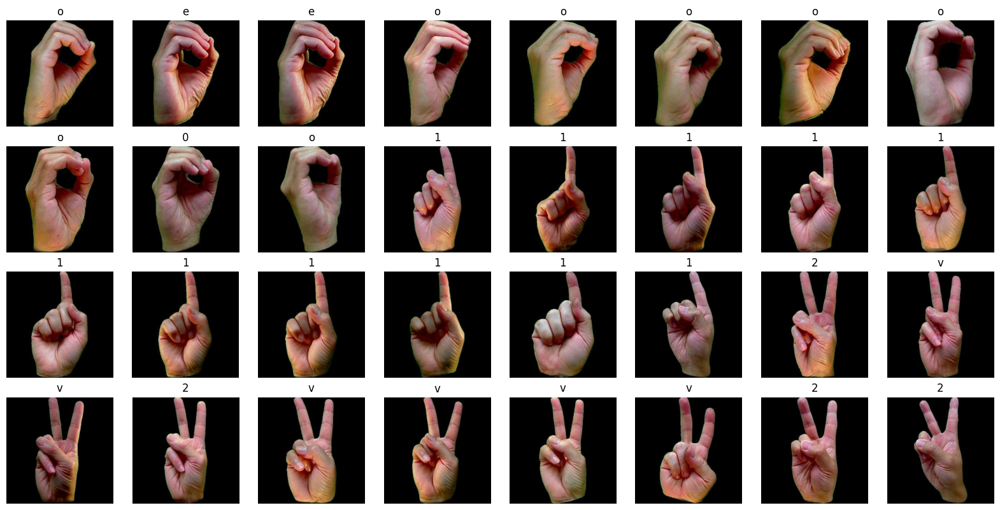

In [ ]:
from mpl_toolkits.axes_grid1 import ImageGrid # create a grid of images in matplotlib.
show_grid(x, 4, 8, label_list=y_int, show_labels=True, figsize=(20,10), savename='/content/drive/MyDrive/Colab Notebooks/ASL_Prediction/predict_image_grid_incV3.png')

In [ ]:
import numpy as np
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Obtain the true class labels from the test data
y_true = test_generator_inc.labels

# Calculate accuracy
accuracy = accuracy_score(y_true, y_pred_classes)

# Calculate precision
precision = precision_score(y_true, y_pred_classes,average='macro')

# Calculate recall
recall = recall_score(y_true, y_pred_classes,average='macro')

# Calculate F1-score
f1 = f1_score(y_true, y_pred_classes,average='macro')

print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1)

Accuracy: 0.851010101010101
Precision: 0.8986914685379597
Recall: 0.851010101010101
F1-score: 0.8340588385203721


Generate predictions on the test data and compute the classification report and confusion matrix.

              precision    recall  f1-score   support

           0       1.00      0.09      0.17        11
           1       0.73      1.00      0.85        11
           2       1.00      0.36      0.53        11
           3       1.00      1.00      1.00        11
           4       0.91      0.91      0.91        11
           5       0.91      0.91      0.91        11
           6       0.50      1.00      0.67        11
           7       0.85      1.00      0.92        11
           8       1.00      0.82      0.90        11
           9       1.00      1.00      1.00        11
           a       1.00      1.00      1.00        11
           b       1.00      1.00      1.00        11
           c       1.00      0.73      0.84        11
           d       0.92      1.00      0.96        11
           e       0.69      1.00      0.81        11
           f       0.92      1.00      0.96        11
           g       1.00      0.91      0.95        11
           h       0.92    

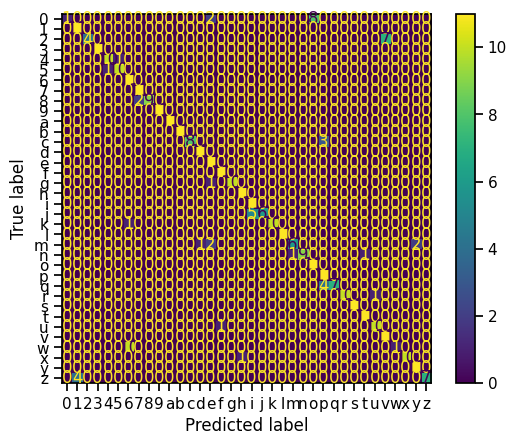

In [ ]:
from sklearn import metrics
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
import numpy as np
import seaborn as sns


# Generate the classification report
class_labels = list(test_generator_inc.class_indices.keys())
report = classification_report(y_true, y_pred_classes, target_names=class_labels)
print(report)

# Generate the confusion matrix
cm = metrics.confusion_matrix(y_true, y_pred_classes)
sns.set_context('notebook')
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=class_labels)
disp.plot()
print("Confusion Matrix:")
print(cm)

###**ii. Experiment 2: Unfreezing Classifier**

Unfreezing classifier of InceptionV3 will load the InceptionV3 base model without the top layers, add new layers on top, unfreeze the classifier and then train and evaluate the model.

####**Building model**


In [ ]:
import keras
import os, shutil

from tensorflow.keras.applications import InceptionV3
from keras.models import Sequential, Model
from keras.layers import Dense, Dropout, Flatten
from keras.preprocessing.image import ImageDataGenerator
from keras.utils import  plot_model
from keras import optimizers

import pandas as pd
import numpy as np

In [ ]:
# Load the InceptionV3 base model without the top layer
InceptionV3_Base = InceptionV3(include_top=False,
              weights='imagenet',
              input_shape=(299,299,3),
              pooling=None,
              classifier_activation='softmax')

87910968/87910968 [==============================] - 0s 0us/step


In [ ]:
for layer in InceptionV3_Base.layers:
    layer.trainable = False

In [ ]:
# Add new top layer
import keras
from keras.layers import Flatten, Dropout, Dense, GlobalAveragePooling2D

InceptionV3TL = keras.models.Sequential()
InceptionV3TL.add(InceptionV3_Base)
InceptionV3TL.add(GlobalAveragePooling2D(name='avg_pool'))

InceptionV3TL.add(Flatten(name='flattened'))
InceptionV3TL.add(Dropout(0.5, name='dropout1'))
InceptionV3TL.add(Dense(512, activation='relu'))
InceptionV3TL.add(Dropout(0.3, name='dropout2'))
InceptionV3TL.add(Dense(36, activation='softmax', name='predictions'))

layers = [(layer, layer.name, layer.trainable) for layer in InceptionV3_Base.layers]
pd.DataFrame(layers, columns=['Layer Type', 'Layer Name', 'Layer Trainable'])

,Layer Type,Layer Name,Layer Trainable
0,<keras.src.engine.input_layer.InputLayer objec...,input_1,False
1,<keras.src.layers.convolutional.conv2d.Conv2D ...,conv2d,False
2,<keras.src.layers.normalization.batch_normaliz...,batch_normalization,False
3,<keras.src.layers.core.activation.Activation o...,activation,False
4,<keras.src.layers.convolutional.conv2d.Conv2D ...,conv2d_1,False
...,...,...,...
306,<keras.src.layers.core.activation.Activation o...,activation_85,False
307,<keras.src.layers.merging.concatenate.Concaten...,mixed9_1,False
308,<keras.src.layers.merging.concatenate.Concaten...,concatenate_1,False
309,<keras.src.layers.core.activation.Activation o...,activation_93,False


In [ ]:
InceptionV3TL.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 8, 8, 2048)        21802784  
                                                                 
 avg_pool (GlobalAveragePoo  (None, 2048)              0         
 ling2D)                                                         
                                                                 
 flattened (Flatten)         (None, 2048)              0         
                                                                 
 dropout1 (Dropout)          (None, 2048)              0         
                                                                 
 dense (Dense)               (None, 512)               1049088   
                                                                 
 dropout2 (Dropout)          (None, 512)               0         
                                                        

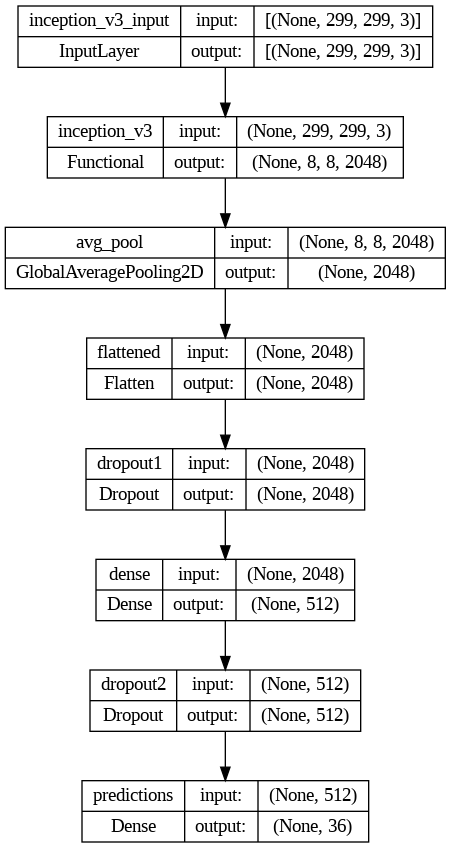

In [ ]:
keras.utils.plot_model(InceptionV3TL, show_shapes=True)

Compile the model using the Adam optimizer, categorical cross-entropy loss and accuracy as the metric.

In [ ]:
from tensorflow.keras import optimizers
from tensorflow.keras import applications

# Compile the model
opt = keras.optimizers.Adam(learning_rate=0.001)
InceptionV3TL.compile(optimizer=opt,
                   loss='categorical_crossentropy',
                   metrics=['accuracy'])

####**Training model**

Train the model for 30 epochs using the augmented training data and validate it using the validation data.

In [ ]:
# Train the model
print (len(train_generator_inc))
history = InceptionV3TL.fit(
            train_generator_inc,
            epochs=30,
            steps_per_epoch=len(train_generator_inc),
            validation_data=validation_generator_inc,
            validation_steps=len(validation_generator_inc))

55
Epoch 1/30
55/55 [==============================] - 61s 863ms/step - loss: 3.2291 - accuracy: 0.1426 - val_loss: 2.1633 - val_accuracy: 0.4262
Epoch 2/30
55/55 [==============================] - 42s 766ms/step - loss: 2.3263 - accuracy: 0.2937 - val_loss: 1.6086 - val_accuracy: 0.5432
Epoch 3/30
55/55 [==============================] - 42s 757ms/step - loss: 1.9549 - accuracy: 0.3830 - val_loss: 1.3348 - val_accuracy: 0.6045
Epoch 4/30
55/55 [==============================] - 42s 756ms/step - loss: 1.6883 - accuracy: 0.4506 - val_loss: 1.1058 - val_accuracy: 0.6657
Epoch 5/30
55/55 [==============================] - 42s 755ms/step - loss: 1.4852 - accuracy: 0.5040 - val_loss: 1.0043 - val_accuracy: 0.7019
Epoch 6/30
55/55 [==============================] - 41s 753ms/step - loss: 1.4513 - accuracy: 0.5347 - val_loss: 0.9572 - val_accuracy: 0.7075
Epoch 7/30
55/55 [==============================] - 45s 815ms/step - loss: 1.3307 - accuracy: 0.5614 - val_loss: 0.8602 - val_accuracy: 0.7

In [ ]:
InceptionV3TL.save('/content/drive/MyDrive/Colab Notebooks/Saved model/InceptionV3TL')

####**Model Evaluation**

Plot the training and validation accuracy, as well as the validation loss, over epochs to evaluate the model's performance and identify overfitting or underfitting.

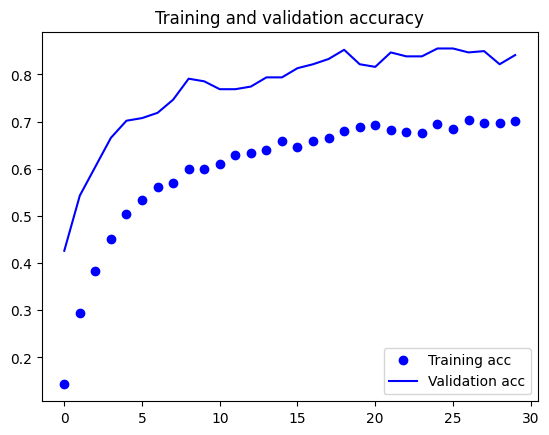

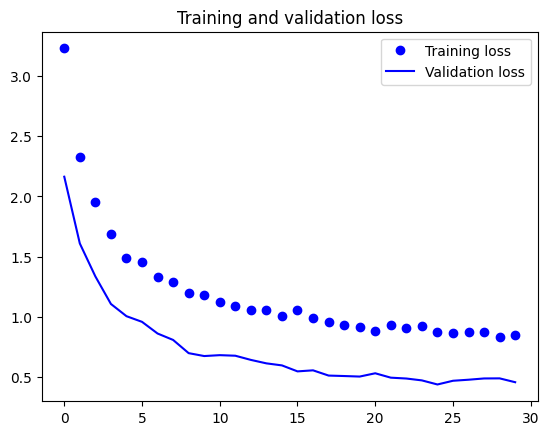

In [ ]:
import matplotlib.pyplot as plt

# Extract accuracy and loss from the history
accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(accuracy))

# Plot training and validation accuracy
plt.plot(epochs, accuracy, 'bo', label='Training acc')
plt.plot(epochs, val_accuracy, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

# Plot training and validation loss
plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

Visualize the predictions made by the model, a grid of images along with their predicted labels can be displayed.

In [ ]:
# display a grid of images, along with optional labels, and the ability to save the grid as an image file.
# visualizse image datasets or model predictions

def show_grid(image_list,nrows,ncols,label_list=None,show_labels=False,savename=None,figsize=(10,10),showaxis='off'):
    if type(image_list) is not list:
        if(image_list.shape[-1]==1):
            image_list = [image_list[i,:,:,0] for i in range(image_list.shape[0])]
        elif(image_list.shape[-1]==3):
            image_list = [image_list[i,:,:,:] for i in range(image_list.shape[0])]
    fig = plt.figure(None, figsize,frameon=False)
    grid = ImageGrid(fig, 111,
                     nrows_ncols=(nrows, ncols),
                     axes_pad=0.3,
                     share_all=True,
                     )
    for i in range(nrows*ncols):
        ax = grid[i]
        ax.imshow(image_list[i],cmap='Greys_r')
        ax.axis('off')
        if show_labels:
            ax.set_title(class_mapping[y_int[i]])
    if savename != None:
        plt.savefig(savename,bbox_inches='tight')

In [ ]:
from keras import models

# Load the saved model
InceptionV3TL = models.load_model('/content/drive/MyDrive/Colab Notebooks/Saved model/InceptionV3TL')

# Create a test data generator
test_generator_inc = test_datagen_inc.flow_from_directory(
        normalized_inc_test_dir,
        target_size=(299, 299),
        batch_size=32,
        class_mode='categorical',
        shuffle=False)

# Predict the classes for the test data
y_pred = InceptionV3TL.predict(test_generator_inc)
y_pred_classes = np.argmax(y_pred, axis=1)

# Get the true classes for the test data
y_true = test_generator_inc.classes

Found 396 images belonging to 36 classes.
13/13 [==============================] - 7s 375ms/step


In [ ]:
y_pred_classes = np.argmax(y_pred, axis=1)

y_true = test_generator_inc.classes

In [ ]:
#structure and format of the input data used for image classification
x, y = next(test_generator_inc) # obtain the next batch of data - with labels from the generator
print("x", type(x))
print("y", type(y))
print("x", x.shape)
print("y", y.shape)

x <class 'numpy.ndarray'>
y <class 'numpy.ndarray'>
x (32, 299, 299, 3)
y (32, 36)


In [ ]:
print(test_generator_inc.class_indices)

{'0': 0, '1': 1, '2': 2, '3': 3, '4': 4, '5': 5, '6': 6, '7': 7, '8': 8, '9': 9, 'a': 10, 'b': 11, 'c': 12, 'd': 13, 'e': 14, 'f': 15, 'g': 16, 'h': 17, 'i': 18, 'j': 19, 'k': 20, 'l': 21, 'm': 22, 'n': 23, 'o': 24, 'p': 25, 'q': 26, 'r': 27, 's': 28, 't': 29, 'u': 30, 'v': 31, 'w': 32, 'x': 33, 'y': 34, 'z': 35}


In [ ]:
y_int = y_pred_classes
class_mapping = ['0', '1','2', '3','4', '5','6', '7','8', '9','a', 'b','c', 'd','e', 'f','g', 'h','i', 'j','k', 'l','m', 'n','o', 'p','q', 'r','s', 't','u', 'v','w', 'x','y', 'z',]

In [ ]:
label_mapping = {'0': 0, '1': 1, '2': 2, '3': 3, '4': 4, '5': 5, '6': 6, '7': 7, '8': 8, '9': 9, 'a': 10, 'b': 11, 'c': 12, 'd': 13, 'e': 14, 'f': 15, 'g': 16, 'h': 17,
 'i': 18, 'j': 19, 'k': 20, 'l': 21, 'm': 22, 'n': 23, 'o': 24, 'p': 25, 'q': 26, 'r': 27, 's': 28, 't': 29, 'u': 30, 'v': 31, 'w': 32, 'x': 33, 'y': 34, 'z': 35}
class_mapping = ['0', '1','2', '3','4', '5','6', '7','8', '9','a', 'b','c', 'd','e', 'f','g', 'h','i', 'j','k', 'l','m', 'n','o', 'p','q', 'r','s', 't','u', 'v','w', 'x','y', 'z',]

# Create a dictionary to map the original labels to modified labels
class_label_mapping = {class_mapping[i]: label_mapping[class_mapping[i]] for i in range(len(class_mapping))}

# define the label
y_int = [class_label_mapping[class_mapping[y_pred_classes[i]]] for i in range(len(y_pred_classes))]


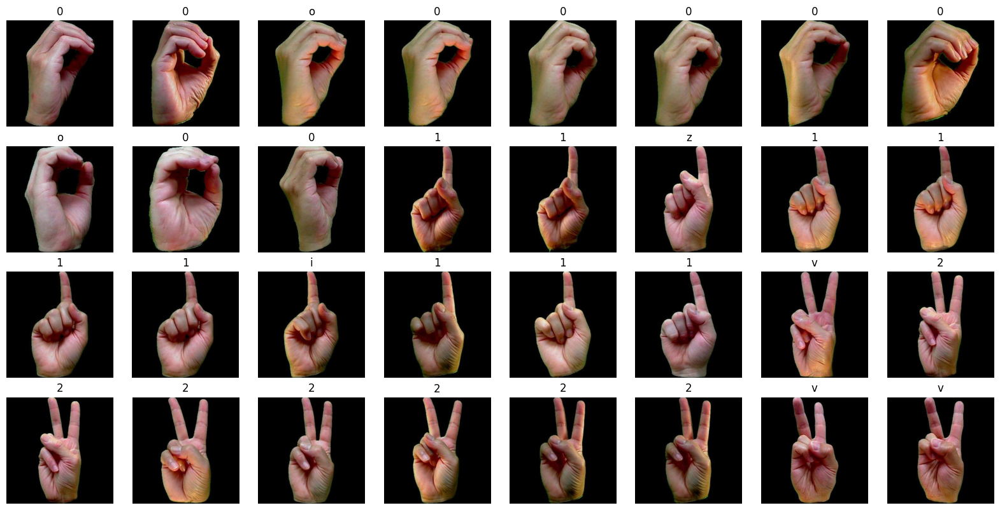

In [ ]:
from mpl_toolkits.axes_grid1 import ImageGrid # create a grid of images in matplotlib.

show_grid(x, 4, 8, label_list=y_int, show_labels=True, figsize=(20,10))

In [ ]:
import numpy as np
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Obtain the true class labels from the test data
y_true = test_generator_inc.labels

# Calculate accuracy
accuracy = accuracy_score(y_true, y_pred_classes)

# Calculate precision
precision = precision_score(y_true, y_pred_classes,average='macro')

# Calculate recall
recall = recall_score(y_true, y_pred_classes,average='macro')

# Calculate F1-score
f1 = f1_score(y_true, y_pred_classes,average='macro')

print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1)

Accuracy: 0.8636363636363636
Precision: 0.8777706861040194
Recall: 0.8636363636363638
F1-score: 0.8600489240449898


Generate predictions on the test data and compute the classification report and confusion matrix.

              precision    recall  f1-score   support

           0       0.64      0.82      0.72        11
           1       0.82      0.82      0.82        11
           2       0.73      0.73      0.73        11
           3       0.92      1.00      0.96        11
           4       0.92      1.00      0.96        11
           5       1.00      0.91      0.95        11
           6       0.83      0.45      0.59        11
           7       0.62      0.45      0.53        11
           8       0.62      0.91      0.74        11
           9       0.85      1.00      0.92        11
           a       0.79      1.00      0.88        11
           b       1.00      1.00      1.00        11
           c       1.00      1.00      1.00        11
           d       0.91      0.91      0.91        11
           e       0.91      0.91      0.91        11
           f       1.00      1.00      1.00        11
           g       1.00      1.00      1.00        11
           h       1.00    

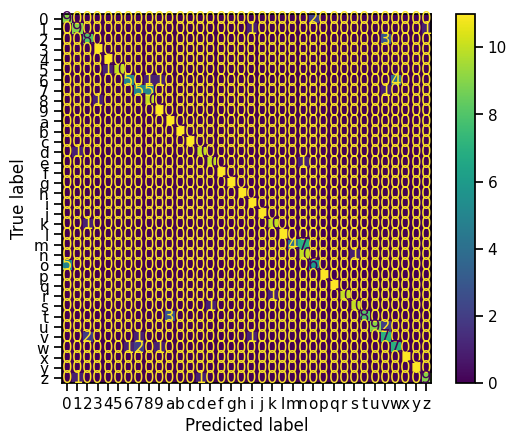

In [ ]:
from sklearn import metrics
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
import numpy as np
import seaborn as sns

# Generate the classification report
class_labels = list(test_generator_inc.class_indices.keys())
report = classification_report(y_true, y_pred_classes, target_names=class_labels)
print(report)

# Generate the confusion matrix
cm = metrics.confusion_matrix(y_true, y_pred_classes)
sns.set_context('notebook')
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=class_labels)
disp.plot()
print("Confusion Matrix:")
print(cm)

###**iii. Experiment 3: Unfreezing Classifier with Fine Tuning**

####Building Model

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from tensorflow.keras.preprocessing.image import ImageDataGenerator

normalized_inc_train_dir = 'asl_dataset_normalized/InceptionV3/train'
normalized_inc_val_dir = 'asl_dataset_normalized/InceptionV3/validation'
normalized_inc_test_dir = 'asl_dataset_normalized/InceptionV3/test'

# ImageDataGenerator for training data with augmentation
train_datagen_inc = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

# ImageDataGenerator for validation data (only rescaling)
val_datagen_inc = ImageDataGenerator(rescale=1./255)

# ImageDataGenerator for test data (only rescaling)
test_datagen_inc = ImageDataGenerator(rescale=1./255)

In [ ]:
# Flow training images in batches of 32 using train_datagen generator
train_generator_inc = train_datagen_inc.flow_from_directory(
    normalized_inc_train_dir,
    target_size=(299, 299),
    batch_size=32,
    class_mode='categorical'
)

# Flow validation images in batches of 32 using val_datagen generator
validation_generator_inc = val_datagen_inc.flow_from_directory(
    normalized_inc_val_dir,
    target_size=(299, 299),
    batch_size=32,
    class_mode='categorical'
)

# Flow test images in batches of 32 using test_datagen generator
test_generator_inc = test_datagen_inc.flow_from_directory(
    normalized_inc_test_dir,
    target_size=(299, 299),
    batch_size=32,
    class_mode='categorical'
)

Found 1760 images belonging to 36 classes.
Found 359 images belonging to 36 classes.
Found 396 images belonging to 36 classes.


In [ ]:
import keras
import os, shutil

from tensorflow.keras.applications import InceptionV3
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten
from keras.preprocessing.image import ImageDataGenerator
from keras.utils import  plot_model
from keras import optimizers

import pandas as pd
import numpy as np

In [ ]:
InceptionV3_model = InceptionV3(include_top=False,
              weights='imagenet',
              input_shape=(299,299,3),
              pooling=None,
              classifier_activation='softmax')

87910968/87910968 [==============================] - 5s 0us/step


In [ ]:
InceptionV3_model.trainable = True

set_trainable = False
for layer in InceptionV3_model.layers:
    if layer.name in ['conv2d_75', 'conv2d_93']:
        set_trainable = True
    if set_trainable:
        layer.trainable = True
    else:
        layer.trainable = False

layers = [(layer, layer.name, layer.trainable) for layer in InceptionV3_model.layers]
pd.DataFrame(layers, columns=['Layer Type', 'Layer Name', 'Layer Trainable'])

,Layer Type,Layer Name,Layer Trainable
0,<keras.src.engine.input_layer.InputLayer objec...,input_1,False
1,<keras.src.layers.convolutional.conv2d.Conv2D ...,conv2d,False
2,<keras.src.layers.normalization.batch_normaliz...,batch_normalization,False
3,<keras.src.layers.core.activation.Activation o...,activation,False
4,<keras.src.layers.convolutional.conv2d.Conv2D ...,conv2d_1,False
...,...,...,...
306,<keras.src.layers.core.activation.Activation o...,activation_85,True
307,<keras.src.layers.merging.concatenate.Concaten...,mixed9_1,True
308,<keras.src.layers.merging.concatenate.Concaten...,concatenate_1,True
309,<keras.src.layers.core.activation.Activation o...,activation_93,True


In [ ]:
import keras
from keras.layers import Flatten, Dropout, Dense, GlobalAveragePooling2D

inceptionV3FT = keras.models.Sequential()
inceptionV3FT.add(InceptionV3_model)
inceptionV3FT.add(GlobalAveragePooling2D(name='avg_pool'))

inceptionV3FT.add(Flatten(name='flattened'))
inceptionV3FT.add(Dropout(0.5, name='dropout1'))
inceptionV3FT.add(Dense(512, activation='relu'))
inceptionV3FT.add(Dropout(0.3, name='dropout2'))
inceptionV3FT.add(Dense(36, activation='softmax', name='predictions'))

In [ ]:
inceptionV3FT.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 8, 8, 2048)        21802784  
                                                                 
 avg_pool (GlobalAveragePoo  (None, 2048)              0         
 ling2D)                                                         
                                                                 
 flattened (Flatten)         (None, 2048)              0         
                                                                 
 dropout1 (Dropout)          (None, 2048)              0         
                                                                 
 dense (Dense)               (None, 512)               1049088   
                                                                 
 dropout2 (Dropout)          (None, 512)               0         
                                                        

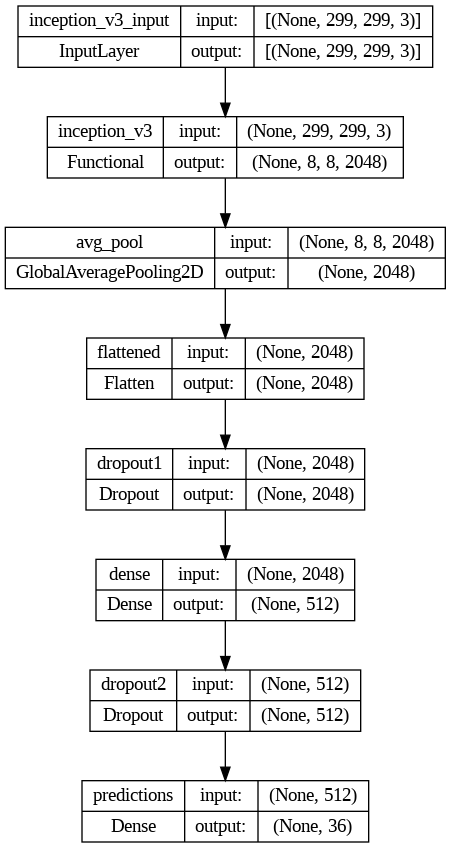

In [ ]:
keras.utils.plot_model(inceptionV3FT, show_shapes=True)

Compile the model using the Adam optimizer, categorical cross-entropy loss and accuracy as the metric.

In [ ]:
from tensorflow.keras import optimizers
from tensorflow.keras import applications

opt = keras.optimizers.Adam(learning_rate=0.001)
inceptionV3FT.compile(optimizer=opt,
                   loss='categorical_crossentropy',
                   metrics=['accuracy'])

####Training Model

Train the model for 30 epochs using the augmented training data and validate it using the validation data.

In [ ]:
print (len(train_generator_inc))
history = inceptionV3FT.fit(
            train_generator_inc,
            epochs=30,
            steps_per_epoch=len(train_generator_inc),
            validation_data=validation_generator_inc,
            validation_steps=len(validation_generator_inc)
)

55
Epoch 1/30
55/55 [==============================] - 47s 852ms/step - loss: 2.1925 - accuracy: 0.3614 - val_loss: 2.2489 - val_accuracy: 0.5153
Epoch 2/30
55/55 [==============================] - 43s 788ms/step - loss: 0.7910 - accuracy: 0.7324 - val_loss: 2.6385 - val_accuracy: 0.5655
Epoch 3/30
55/55 [==============================] - 44s 805ms/step - loss: 0.5939 - accuracy: 0.7926 - val_loss: 0.7527 - val_accuracy: 0.7911
Epoch 4/30
55/55 [==============================] - 44s 793ms/step - loss: 0.4870 - accuracy: 0.8330 - val_loss: 0.2897 - val_accuracy: 0.8969
Epoch 5/30
55/55 [==============================] - 45s 799ms/step - loss: 0.4168 - accuracy: 0.8580 - val_loss: 0.3528 - val_accuracy: 0.8635
Epoch 6/30
55/55 [==============================] - 43s 790ms/step - loss: 0.3343 - accuracy: 0.8807 - val_loss: 0.2377 - val_accuracy: 0.9164
Epoch 7/30
55/55 [==============================] - 56s 1s/step - loss: 0.3229 - accuracy: 0.8852 - val_loss: 0.4358 - val_accuracy: 0.8468

In [ ]:
inceptionV3FT.save('/content/drive/MyDrive/Colab Notebooks/Saved model/inceptionV3FT.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


####Model Evaluation

Plot the training and validation accuracy, as well as the validation loss, over epochs to evaluate the model's performance and identify overfitting or underfitting.

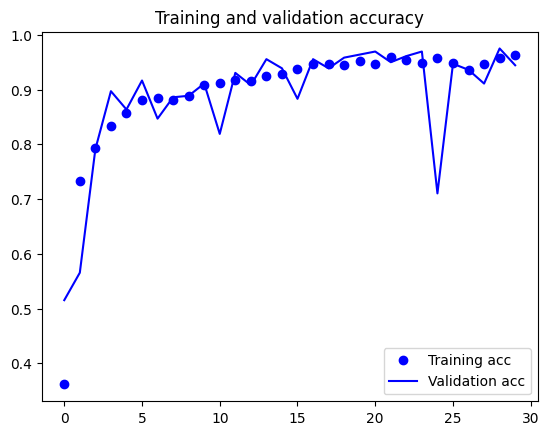

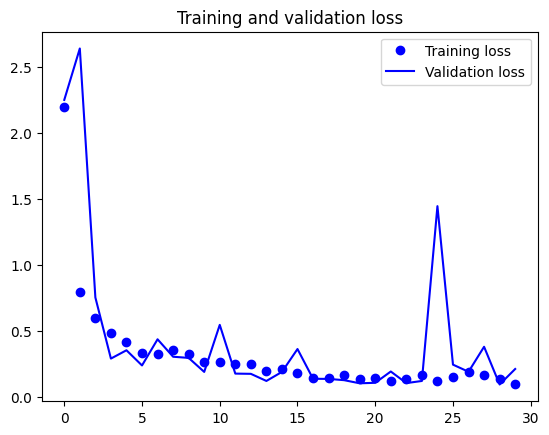

In [ ]:
import matplotlib.pyplot as plt

accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(accuracy))

plt.plot(epochs, accuracy, 'bo', label='Training acc')
plt.plot(epochs, val_accuracy, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

Visualize the predictions made by the model, a grid of images along with their predicted labels can be displayed.

In [ ]:
# display a grid of images, along with optional labels, and the ability to save the grid as an image file.
# visualizse image datasets or model predictions

def show_grid(image_list,nrows,ncols,label_list=None,show_labels=False,savename=None,figsize=(10,10),showaxis='off'):
    if type(image_list) is not list:
        if(image_list.shape[-1]==1):
            image_list = [image_list[i,:,:,0] for i in range(image_list.shape[0])]
        elif(image_list.shape[-1]==3):
            image_list = [image_list[i,:,:,:] for i in range(image_list.shape[0])]
    fig = plt.figure(None, figsize,frameon=False)
    grid = ImageGrid(fig, 111,
                     nrows_ncols=(nrows, ncols),
                     axes_pad=0.3,
                     share_all=True,
                     )
    for i in range(nrows*ncols):
        ax = grid[i]
        ax.imshow(image_list[i],cmap='Greys_r')
        ax.axis('off')
        if show_labels:
            ax.set_title(class_mapping[y_int[i]])
    if savename != None:
        plt.savefig(savename,bbox_inches='tight')

In [ ]:
from keras import models

# Load the saved model
saved_incV3FT_model = models.load_model('/content/drive/MyDrive/Colab Notebooks/Saved model/inceptionV3FT.h5')

# Create a test data generator
test_generator_inc = test_datagen_inc.flow_from_directory(
        normalized_inc_test_dir,
        target_size=(299, 299),
        batch_size=32,
        class_mode='categorical',
        shuffle=False)

# Predict the classes for the test data
y_pred = saved_incV3FT_model.predict(test_generator_inc)
y_pred_classes = np.argmax(y_pred, axis=1)

# Get the true classes for the test data
y_true = test_generator_inc.classes

Found 396 images belonging to 36 classes.
13/13 [==============================] - 6s 352ms/step


In [ ]:
y_pred_classes = np.argmax(y_pred, axis=1)

y_true = test_generator_inc.classes

In [ ]:
#structure and format of the input data used for image classification
x, y = next(test_generator_inc) # obtain the next batch of data - with labels from the generator
print("x", type(x))
print("y", type(y))
print("x", x.shape)
print("y", y.shape)

x <class 'numpy.ndarray'>
y <class 'numpy.ndarray'>
x (32, 299, 299, 3)
y (32, 36)


In [ ]:
print(test_generator_inc.class_indices)

{'0': 0, '1': 1, '2': 2, '3': 3, '4': 4, '5': 5, '6': 6, '7': 7, '8': 8, '9': 9, 'a': 10, 'b': 11, 'c': 12, 'd': 13, 'e': 14, 'f': 15, 'g': 16, 'h': 17, 'i': 18, 'j': 19, 'k': 20, 'l': 21, 'm': 22, 'n': 23, 'o': 24, 'p': 25, 'q': 26, 'r': 27, 's': 28, 't': 29, 'u': 30, 'v': 31, 'w': 32, 'x': 33, 'y': 34, 'z': 35}


In [ ]:
y_int = y_pred_classes
class_mapping = ['0', '1','2', '3','4', '5','6', '7','8', '9','a', 'b','c', 'd','e', 'f','g', 'h','i', 'j','k', 'l','m', 'n','o', 'p','q', 'r','s', 't','u', 'v','w', 'x','y', 'z',]

In [ ]:
label_mapping = {'0': 0, '1': 1, '2': 2, '3': 3, '4': 4, '5': 5, '6': 6, '7': 7, '8': 8, '9': 9, 'a': 10, 'b': 11, 'c': 12, 'd': 13, 'e': 14, 'f': 15, 'g': 16, 'h': 17,
 'i': 18, 'j': 19, 'k': 20, 'l': 21, 'm': 22, 'n': 23, 'o': 24, 'p': 25, 'q': 26, 'r': 27, 's': 28, 't': 29, 'u': 30, 'v': 31, 'w': 32, 'x': 33, 'y': 34, 'z': 35}
class_mapping = ['0', '1','2', '3','4', '5','6', '7','8', '9','a', 'b','c', 'd','e', 'f','g', 'h','i', 'j','k', 'l','m', 'n','o', 'p','q', 'r','s', 't','u', 'v','w', 'x','y', 'z',]

# Create a dictionary to map the original labels to modified labels
class_label_mapping = {class_mapping[i]: label_mapping[class_mapping[i]] for i in range(len(class_mapping))}

# define the label
y_int = [class_label_mapping[class_mapping[y_pred_classes[i]]] for i in range(len(y_pred_classes))]


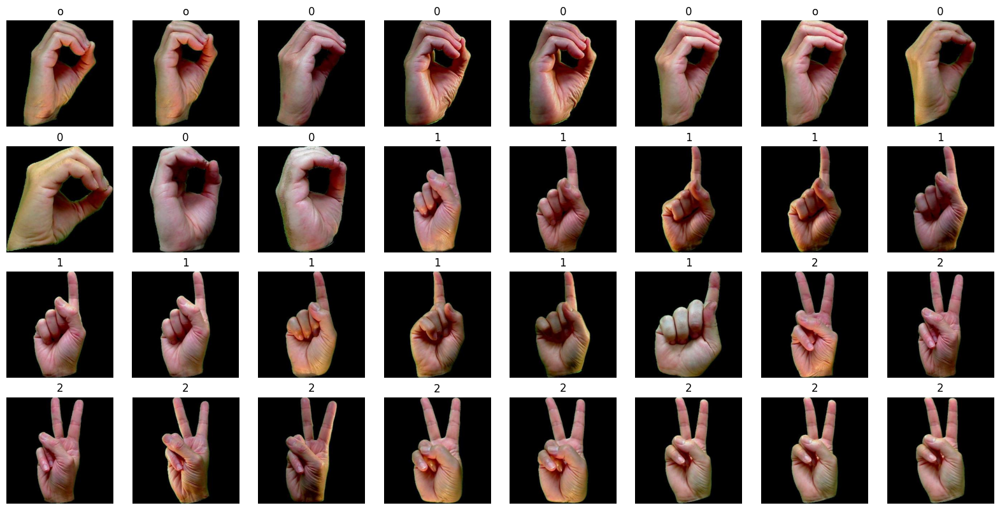

In [ ]:
from mpl_toolkits.axes_grid1 import ImageGrid # create a grid of images in matplotlib.

show_grid(x, 4, 8, label_list=y_int, show_labels=True, figsize=(20,10), savename='/content/drive/MyDrive/Colab Notebooks/ASL_Prediction/predict_image_grid_incV3FT.png')

In [ ]:
import numpy as np
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Obtain the true class labels from the test data
y_true = test_generator_inc.labels

# Calculate accuracy
accuracy = accuracy_score(y_true, y_pred_classes)

# Calculate precision
precision = precision_score(y_true, y_pred_classes,average='macro')

# Calculate recall
recall = recall_score(y_true, y_pred_classes,average='macro')

# Calculate F1-score
f1 = f1_score(y_true, y_pred_classes,average='macro')

print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1)

Accuracy: 0.9545454545454546
Precision: 0.965418956043956
Recall: 0.9545454545454545
F1-score: 0.9535669267826654


Generate predictions on the test data and compute the classification report and confusion matrix.

              precision    recall  f1-score   support

           0       1.00      0.73      0.84        11
           1       1.00      1.00      1.00        11
           2       1.00      1.00      1.00        11
           3       1.00      1.00      1.00        11
           4       0.92      1.00      0.96        11
           5       1.00      1.00      1.00        11
           6       0.85      1.00      0.92        11
           7       1.00      1.00      1.00        11
           8       1.00      1.00      1.00        11
           9       1.00      1.00      1.00        11
           a       1.00      0.64      0.78        11
           b       1.00      1.00      1.00        11
           c       1.00      1.00      1.00        11
           d       1.00      1.00      1.00        11
           e       1.00      1.00      1.00        11
           f       1.00      1.00      1.00        11
           g       1.00      1.00      1.00        11
           h       1.00    

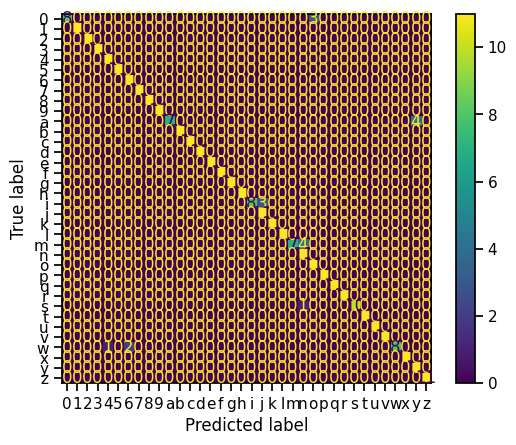

In [ ]:
from sklearn import metrics
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
import numpy as np
import seaborn as sns


# Generate the classification report
class_labels = list(test_generator_inc.class_indices.keys())
report = classification_report(y_true, y_pred_classes, target_names=class_labels)
print(report)

# Generate the confusion matrix
cm = metrics.confusion_matrix(y_true, y_pred_classes)
sns.set_context('notebook')
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=class_labels)
disp.plot()
print("Confusion Matrix:")
print(cm)